In [1]:
# Homework 5 (due 07/30/2024)
#Catherine Chu (updated version based on the last bug fix)

# SVM and Kernels

### Objective
Through this project, you will learn to use nonlinear kernels to improve a support vector classifier. The toy examples within this project aim to guide you as you build your intuition for the decision boundaries that can be generated via different kernels.

This project is structured as follows:
#### Part 1: Binary classification of synthetic data
1.1. Generate and explore synthetic data

1.2. SVM with nonlinear kernels
#### Part 2: US Flags
2.1. Load and explore flags data

2.2. SVMs for flag pixel data

2.3. Comparison to decision trees


In [13]:
# standard imports
import os, random
import numpy as np
import matplotlib.pyplot as plt

# sklearn imports
from sklearn.datasets import *
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.inspection import DecisionBoundaryDisplay

# you may need to install the PIL in your environment
# for installation in mamba environment type "mamba install pillow -c conda-forge" in your miniforge prompt
# for installation in conda environment type "conda install pillow -c conda-forge" in your conda prompt or anaconda prompt
# for installation via pip type "pip install pillow" in your terminal
from PIL import Image

## Part 1: Binary classification of synthetic data

### Part 1.1: Generate and explore synthetic data
The next cell defines the function `generate_dataset`, which you can use to generate synthetic (i.e., computer generated) data sets for binary classification. It includes eight different methods for data-set generation. 
1. Try out each method and visualize the resulting data set. For the 'swiss' and 'scurve' data sets, try out two different values of the keyword argument `splits`.
2. Comment on WHETHER and WHY you anticipate this data set to be relatively easy or relatively hard to classify with a linear classifier.
3. Comment on WHETHER and WHY you anticipate this data set to be relatively easy or relatively hard to classify with a nonlinear classifier.

In [14]:
# Function to convert an array of real numbers into an array of 0s and 1s
def binarize(arr, split=10):
    # Calculate the decile thresholds
    percentiles = int(np.ceil(100/split))
    split_points = np.arange(0, 100+percentiles, percentiles)
    split_points[split_points>100] = 100
    deciles = np.percentile(arr, split_points)
    
    # Create a new array to hold the modified values
    modified_arr = np.zeros_like(arr)
    
    # Iterate through each decile range and set values accordingly
    print('split', split)
    for i in range(split):
        print(i)
        if i >= split-1:
            if i % 2 == 0:
                # Set values in even deciles to 0
                modified_arr[(arr >= deciles[i])] = 0
            else:
                # Set values in odd deciles to 1
                modified_arr[(arr >= deciles[i])] = 1
                
        elif i % 2 == 0:
            # Set values in even deciles to 0
            modified_arr[(arr >= deciles[i]) & (arr < deciles[i + 1])] = 0
        else:
            # Set values in odd deciles to 1
            modified_arr[(arr >= deciles[i]) & (arr < deciles[i + 1])] = 1
    
    return modified_arr

# Function to generate datasets
def generate_dataset(dataset_type, n_samples=300, noise=0.1, split=10, random_state=0):
    if dataset_type == 'linearly_separable':
        X, y = make_classification(n_samples=n_samples, n_features=2, n_redundant=0, n_informative=2,
                                   random_state=random_state, n_clusters_per_class=1)
    elif dataset_type == 'blobs':
        X, y = make_blobs(n_samples=[n_samples//2, n_samples//2], random_state=random_state, cluster_std=noise)
    elif dataset_type == 'quantiles':
        X, y = make_gaussian_quantiles(n_samples=n_samples, n_classes=2, cov=noise, random_state=random_state)
    elif dataset_type == 'moons':
        X, y = make_moons(n_samples=n_samples, noise=noise, random_state=random_state)
    elif dataset_type == 'circles':
        X, y = make_circles(n_samples=n_samples, noise=noise, factor=0.5, random_state=random_state)
    elif dataset_type == 'unstructured':
        X, y = np.random.random(size=(n_samples, 2)), np.random.randint(0,2, size=(n_samples))
    elif dataset_type == 'swiss':
        X, y = make_swiss_roll(n_samples=n_samples, noise=noise, random_state=random_state)
        X=np.array([X[:,0],X[:,2]]).T
        y = binarize(y, split=split)
    elif dataset_type == 'scurve':
        X, y = make_s_curve(n_samples=n_samples, noise=noise, random_state=random_state)
        X=np.array([X[:,0],X[:,2]]).T
        y = binarize(y, split=split)
    else:
        raise ValueError("Invalid dataset type")
    
    X = StandardScaler().fit_transform(X)
    return X, y

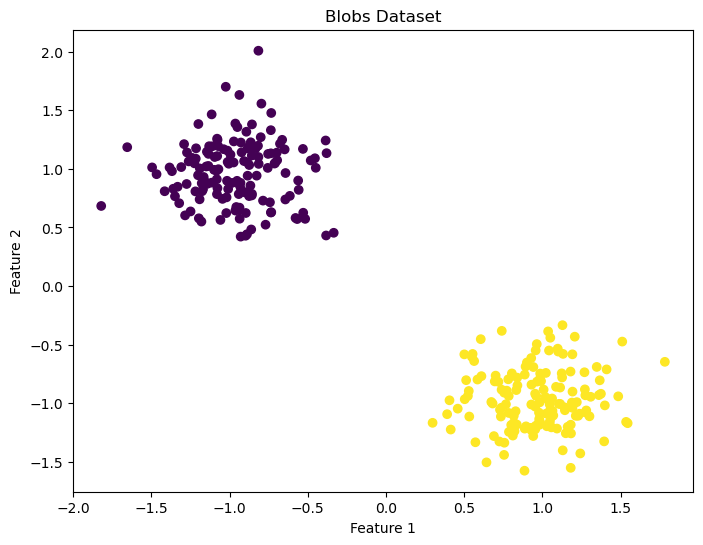

In [15]:
# Generate and visualize data blobs

X, y = make_blobs(n_samples=300, centers=2, random_state=42)
X = StandardScaler().fit_transform(X)

# Visualize the dataset
plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=y)
plt.title('Blobs Dataset')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()

1. I anticipate that this data set will be EASY to classify with a linear classifier becauase the two groups are very distinct
2. I anticipate that this data will be slightly harder to classify than the linear classiifer. However, it should still perform fairly well because the polynomial classifiers, for example, are examples of nonlinear classifiers that can perform a linear classification. 

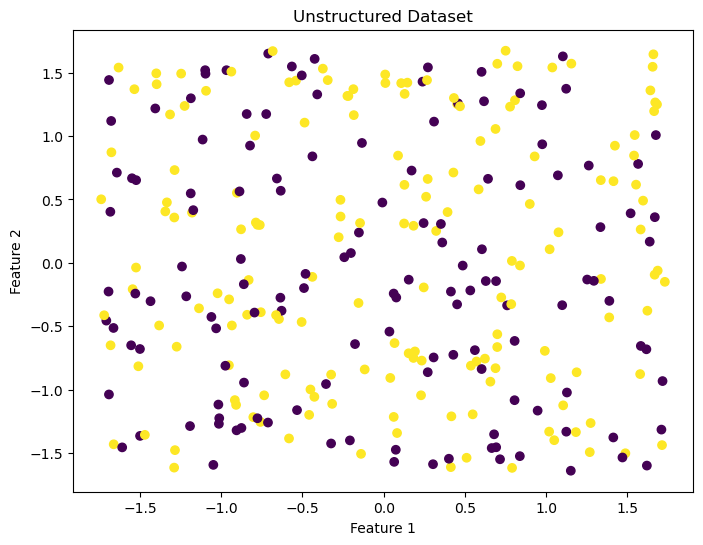

In [16]:
# Generate and visualize unstructured data

np.random.seed(0)
X = np.random.random(size=(300, 2))
y = np.random.randint(0, 2, size=(300))

# Standardize features
X = StandardScaler().fit_transform(X)

# Visualize the dataset
plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=y)
plt.title('Unstructured Dataset')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()

1. I anticipate that this data set will be very hard for linear classifiers because the data is completely random and all over the place. 
2. I anticipate that this data will ALSO be hard for nonlinear classifiers becuase the data doesn't have a pattern that can be fit with even a complex model. 

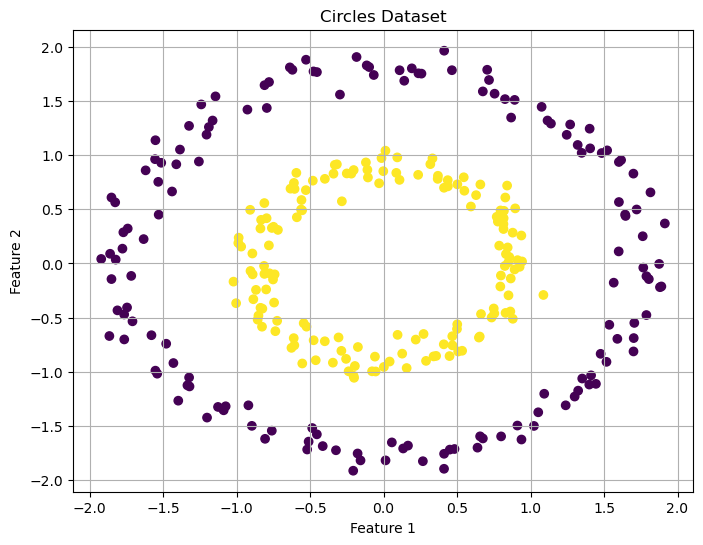

In [17]:
# Generate and visualize circles data set

#I added in this line because I don't want a different response everytime I generate it. 
np.random.seed(42)
X, y = make_circles(n_samples=300, factor=0.5, noise=0.05, random_state=0)

X = StandardScaler().fit_transform(X)

# Visualize the dataset
plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=y)
plt.title('Circles Dataset')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.grid(True)
plt.show()

1. This data will be very difficult for a linear classifier becuase if you were to just write the equation for a deicison boundary. it would have multiple variables raised to the power of two to form an ellipse.
2. This data set should be easier for a nonlinear classifier like the kernel to classify because it requires more complexity.  

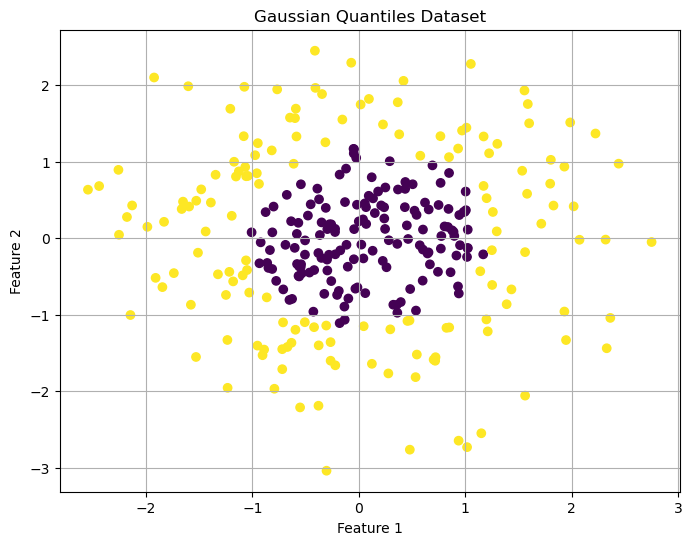

In [18]:
# Generate and visualize Gaussian quantiles

np.random.seed(42)  # For reproducibility
X, y = make_gaussian_quantiles(mean=None, cov=1.0, n_samples=300, n_features=2, n_classes=2, random_state=0)

# Standardize features
X = StandardScaler().fit_transform(X)

# Visualize the dataset
plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=y)
plt.title('Gaussian Quantiles Dataset')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.grid(True)
plt.show()

1. This is simlar to the last dataset. It will be very difficult for the linear classifier to classify because the deicison boundary looks elliptical
2. As with the last dataset that I visualized, it will be easier for a nonlinear clasisifer such as a kernel to classify the boundary. 

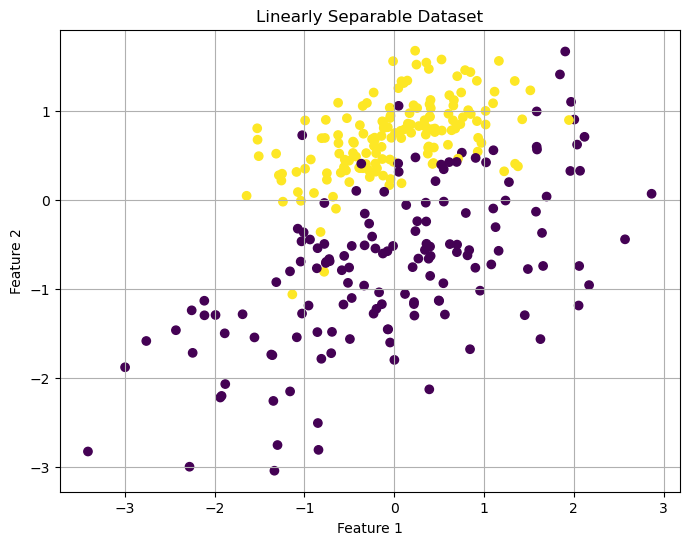

In [19]:
# Generate and visualize linearly separable data
np.random.seed(42)
X, y = make_classification(n_samples=300, n_features=2, n_redundant=0, n_informative=2, n_clusters_per_class=1, random_state=0)

# Standardize features
X = StandardScaler().fit_transform(X)

# Visualize the dataset
plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=y)
plt.title('Linearly Separable Dataset')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.grid(True)
plt.show()

1. I anticipate that this data set will be easy for linear classifiers to produce a deciison boundary as there is a clear line between the two features.
2. The nonlinear clasisifer will also be good at this becauase it can just produce a linear function. However, since the nonlinear classifier will have extra complexity that isn't needed, the linear classifier is still better for RAM and speed purposes. 

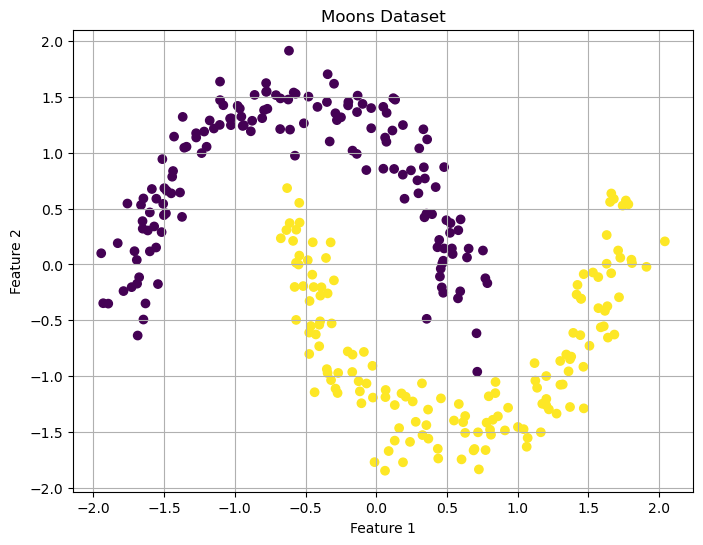

In [20]:
# Generate and visualize moons data set
np.random.seed(42)
X, y = make_moons(n_samples=300, noise=0.1, random_state=0)  # Added noise for more complexity

# Standardize features
X = StandardScaler().fit_transform(X)

# Visualize the dataset
plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=y)
plt.title('Moons Dataset')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.grid(True)
plt.show()

1. I anticipate that this data set will be difficult for linear classifiers because the deicison boundary should probably look like a polynomial
2. This dataset will be easier for nonlinear classiifers to produce a deicsion boundary that is curved like a polynomial 

split 2
0
1


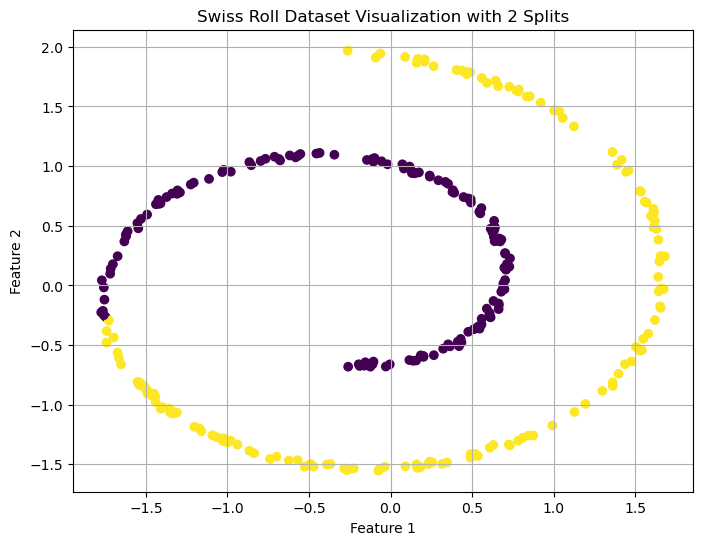

In [21]:
# Generate and visualize swiss role with 2 split sets

np.random.seed(42)
X, color = make_swiss_roll(n_samples=300, noise=0.1, random_state=0)
X = np.vstack([X[:, 0], X[:, 2]]).T 
y = binarize(color, split=2)

# Standardize features
X = StandardScaler().fit_transform(X)

# Visualize the dataset
plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=y)
plt.title('Swiss Roll Dataset Visualization with 2 Splits')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.grid(True)
plt.show()



1. I anticipate that this data set will be VERY very hard for the linear classifer because of the breaks in the dataset throughout the figure. There are also complex patterns that cannot be easily captured by linear classifiers.
2. This would probably still be hard for a non-linear classifier. however, it's probably only possible to classify with a nonlinear classifier. 

split 2
0
1


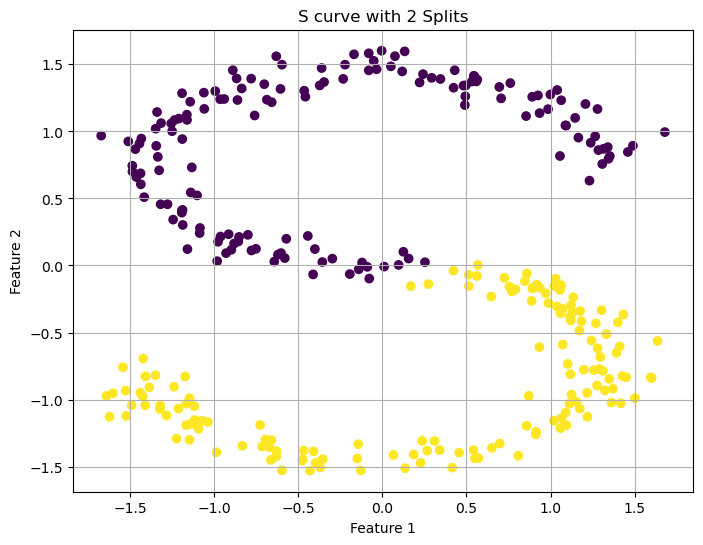

In [22]:
# Generate and visualize S curve with 2 split sets

np.random.seed(42)
X, color = make_s_curve(n_samples=300, noise=0.1, random_state=0)
X = np.vstack([X[:, 0], X[:, 2]]).T 
y = binarize(color, split=2)

# Standardize features
X = StandardScaler().fit_transform(X)

# Visualize the dataset
plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=y)
plt.title('S curve with 2 Splits')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.grid(True)
plt.show()

1. I anticipate that this dataset will be very difficult to classify with the linear clasisfiers as it can't handle this level of complexity. MAYBE for the 2 split one, the s curve is divided enough that it can scrape togther something but with the increasing levels of splits, the linear classifer is not idea.
2. I anticipate that this dataset will require a nonlinear classifier to handle. Especially for larger split sizes, we need a nonlinear classifer to handle this. 

split 10
0
1
2
3
4
5
6
7
8
9


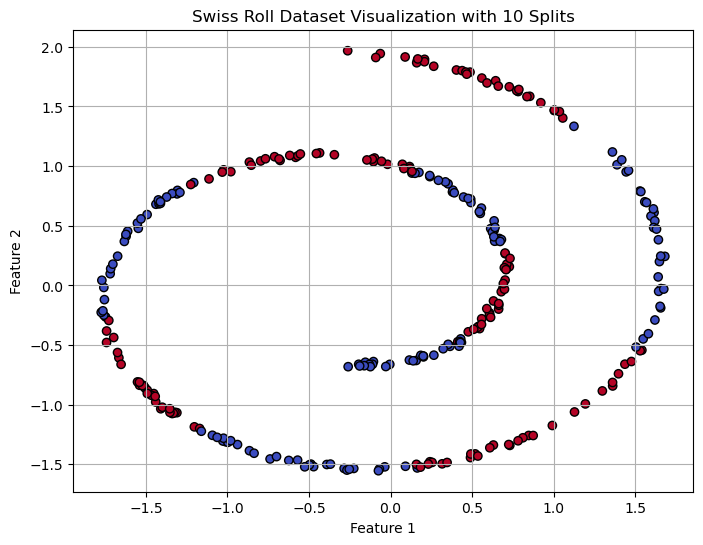

In [23]:
# Generate and visualize swiss role with 10 split sets

#here's another split for 10
np.random.seed(42)  # For reproducibility
X, color = make_swiss_roll(n_samples=300, noise=0.1, random_state=0)
X = np.vstack([X[:, 0], X[:, 2]]).T  # Flatten to 2D
y = binarize(color, split=10)  # Binarize with 10 splits based on the color

# Standardize features
X = StandardScaler().fit_transform(X)

# Visualize the dataset
plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=y, cmap='coolwarm', edgecolors='k')
plt.title('Swiss Roll Dataset Visualization with 10 Splits')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.grid(True)
plt.show()

1. Like I wrote above, I anticipate that this will be very difficult for a linear classifier because of the complex changes between the two features and the breaks in samples.
2. We need the complexity of a nonlinear classifer to handle this. 

split 10
0
1
2
3
4
5
6
7
8
9


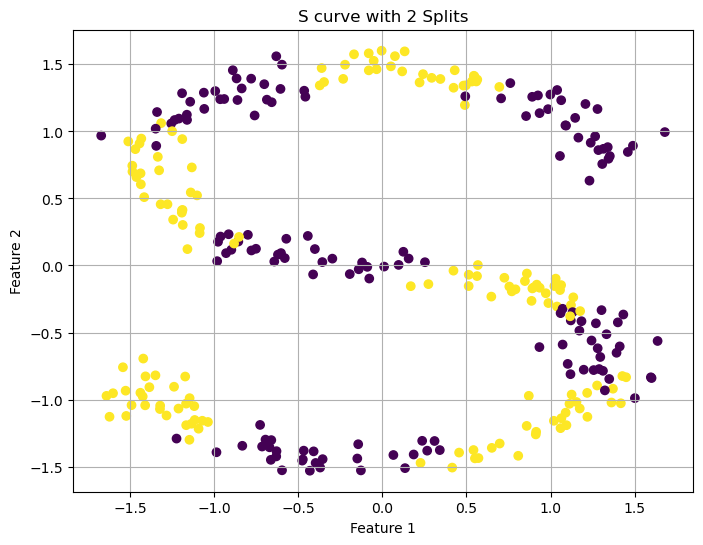

In [24]:
# Generate and visualize S curve with 10 split sets

#s curve  split with the split of 10
np.random.seed(42)
X, color = make_s_curve(n_samples=300, noise=0.1, random_state=0)
X = np.vstack([X[:, 0], X[:, 2]]).T 
y = binarize(color, split=10)

# Standardize features
X = StandardScaler().fit_transform(X)

# Visualize the dataset
plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=y)
plt.title('S curve with 2 Splits')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.grid(True)
plt.show()

1. This data will be difficult for a linear classifier because of the breaks in feature sets and groups of features in various locations.
2. We will need a non-linear classifier to handle this level fo complexity 

### Part 1.2: SVM with nonlinear kernels

The next cell defines the function `kernel_comparison`, which you can use to visually compare the decision boundaries generated by SVMs with different kernels. 

1. The kernel comparison currently produces only visual results. Add code to the function so that it also outputs train and test accuracy of the different SVMs. (Note: Think carefully about where the right place in the code is to do a train-test split.)
2. Run the kernel comparison for the data sets from Part 1.1. Do the results confirm or contradict your expectations that you formulated in Part 1.1.? Did any of the results surprise you?
3. Consult sklearn's documentation to learn how the keyword arguments `degree` and `gamma` affect your classifier. Try out a few different values of these parameters. How and what can one infer from the shape of the decision boundary about the classifier's `degree` or `gamma`?

In [25]:
def kernel_comparison(X, y, support_vectors=True, tight_box=False, if_flag=False):

    fig = plt.figure(figsize=(10,3))
    
    for ikernel, kernel in enumerate(['linear', 'poly', 'rbf', 'sigmoid']):
        # Train the SVC
        clf = svm.SVC(kernel=kernel, degree=3, gamma=3).fit(X, y)
    
        # Settings for plotting
        ax = plt.subplot(1,4,1+ikernel)
        #x_min, x_max, y_min, y_max = -3, 3, -3, 3
        #ax.set(xlim=(x_min, x_max), ylim=(y_min, y_max))
    
        # Plot decision boundary and margins
        common_params = {"estimator": clf, "X": X, "ax": ax}
        DecisionBoundaryDisplay.from_estimator(
            **common_params,
            response_method="predict",
            plot_method="pcolormesh",
            alpha=0.3,
        )
        DecisionBoundaryDisplay.from_estimator(
            **common_params,
            response_method="decision_function",
            plot_method="contour",
            levels=[-1, 0, 1],
            colors=["k", "k", "k"],
            linestyles=["--", "-", "--"],
        )
    
        if support_vectors:
            # Plot bigger circles around samples that serve as support vectors
            ax.scatter(
                clf.support_vectors_[:, 0],
                clf.support_vectors_[:, 1],
                s=150,
                facecolors="none",
                edgecolors="k",
            )
    
        # Plot samples by color and add legend
        ax.scatter(X[:, 0], X[:, 1], c=y, s=30, edgecolors="k")
        ax.set_title(kernel)
        ax.axis('off')
        if tight_box:
            ax.set_xlim([X[:, 0].min(), X[:, 0].max()])
            ax.set_ylim([X[:, 1].min(), X[:, 1].max()])

    plt.tight_layout()
    plt.show()

Dataset: linearly_separable


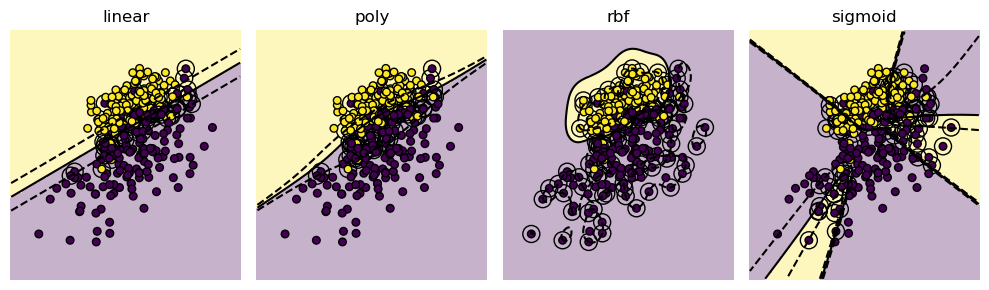

Dataset: blobs


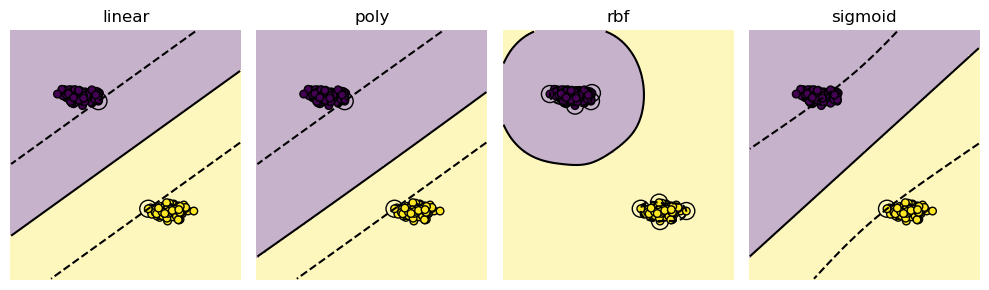

Dataset: quantiles


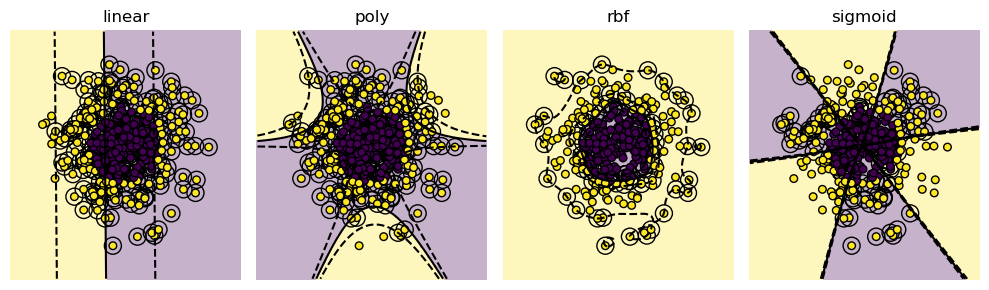

Dataset: moons


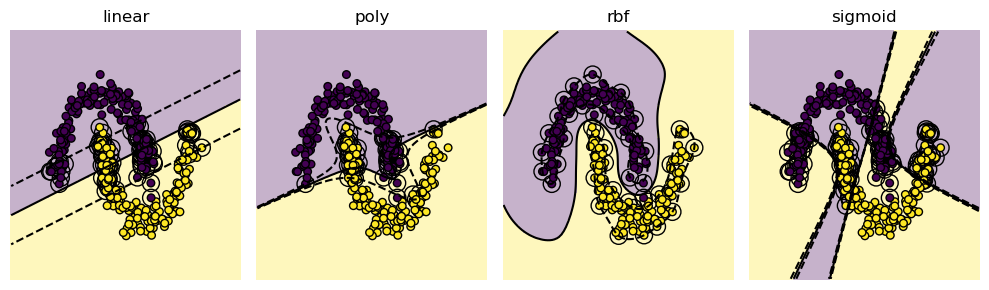

Dataset: circles


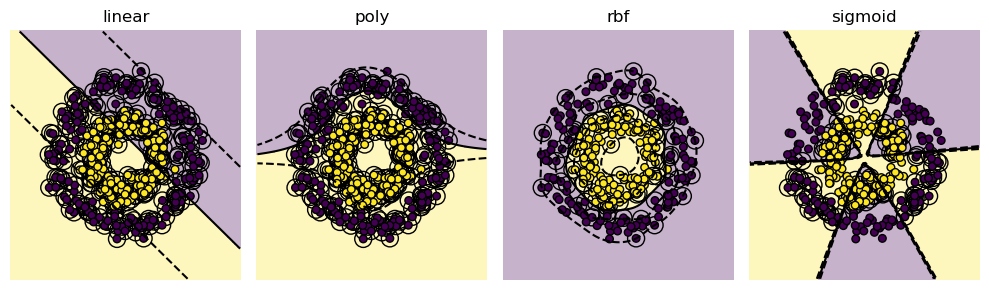

Dataset: unstructured


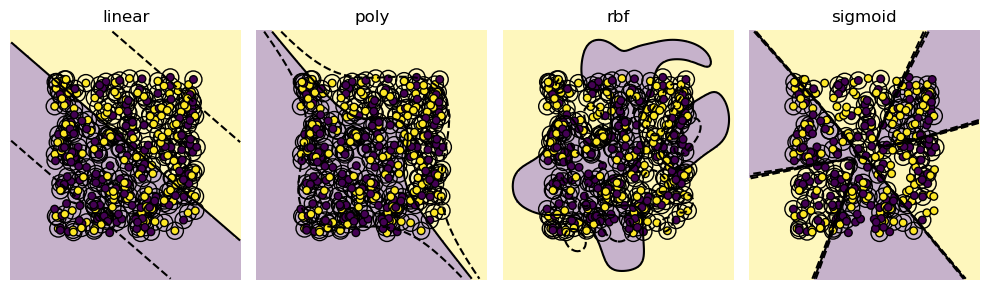

Dataset: swiss
split 10
0
1
2
3
4
5
6
7
8
9


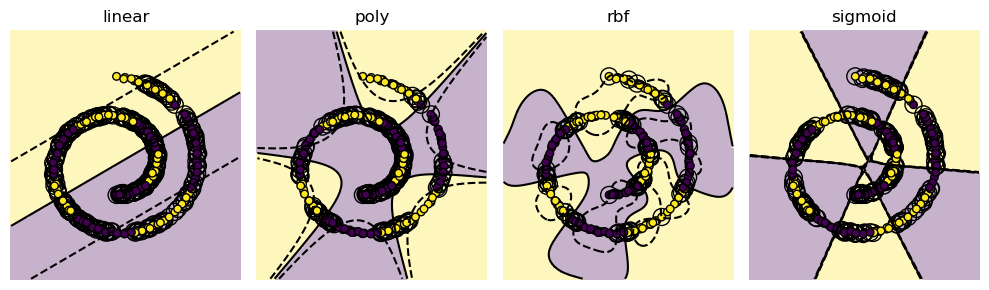

Dataset: scurve
split 10
0
1
2
3
4
5
6
7
8
9


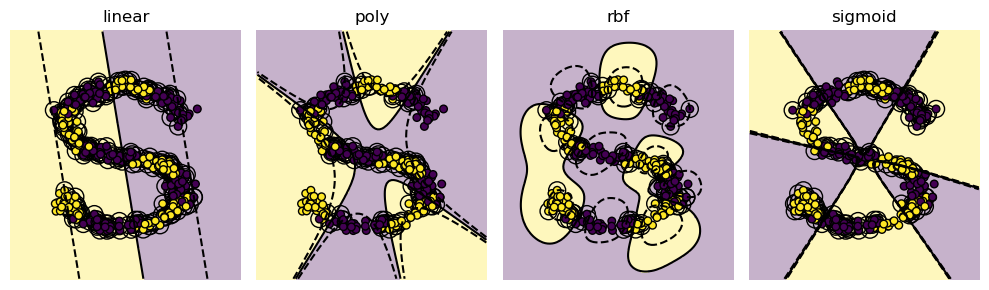

In [26]:
from sklearn import svm
# Show results of kernel comparison for data sets from part 1
dataset_types = ['linearly_separable', 'blobs', 'quantiles', 'moons', 'circles', 'unstructured', 'swiss', 'scurve']

for d_type in dataset_types:
    print(f"Dataset: {d_type}")
    X, y = generate_dataset(d_type)
    kernel_comparison(X, y)

To summarize the results of the kernel comparison, RBF is super effecitve for shapes that are curvy and resemble higher dimensional decision boundaries. Examples of effective boundaries drawn by rbf are the scurve, swiss, the moons and the circles. Linear is effective for a couple of distributions and is only very accurate for the linear and linearly separable dat. Sigmoid is accurate for NONE of then except blobs. Poly is also pretty good for the linear ones and makes some attempt at doing the scurve pretty well. 

To summarize the results of the kernel comparison, RBF is super effecitve for shapes that are curvy and resemble higher dimensional decision boundaries. Examples of effective boundaries drawn by rbf are the 

In [27]:
# Examine effect of degree and gamma keyword
def kernel_comparison(X, y, support_vectors=True, tight_box=False, if_flag=False):

    fig = plt.figure(figsize=(10,3))
    
    for ikernel, kernel in enumerate(['linear', 'poly', 'rbf', 'sigmoid']):
        # Train the SVC
        clf = svm.SVC(kernel=kernel, degree=5, gamma=3).fit(X, y)
    
        # Settings for plotting
        ax = plt.subplot(1,4,1+ikernel)
        #x_min, x_max, y_min, y_max = -3, 3, -3, 3
        #ax.set(xlim=(x_min, x_max), ylim=(y_min, y_max))
    
        # Plot decision boundary and margins
        common_params = {"estimator": clf, "X": X, "ax": ax}
        DecisionBoundaryDisplay.from_estimator(
            **common_params,
            response_method="predict",
            plot_method="pcolormesh",
            alpha=0.3,
        )
        DecisionBoundaryDisplay.from_estimator(
            **common_params,
            response_method="decision_function",
            plot_method="contour",
            levels=[-1, 0, 1],
            colors=["k", "k", "k"],
            linestyles=["--", "-", "--"],
        )
    
        if support_vectors:
            # Plot bigger circles around samples that serve as support vectors
            ax.scatter(
                clf.support_vectors_[:, 0],
                clf.support_vectors_[:, 1],
                s=150,
                facecolors="none",
                edgecolors="k",
            )
    
        # Plot samples by color and add legend
        ax.scatter(X[:, 0], X[:, 1], c=y, s=30, edgecolors="k")
        ax.set_title(kernel)
        ax.axis('off')
        if tight_box:
            ax.set_xlim([X[:, 0].min(), X[:, 0].max()])
            ax.set_ylim([X[:, 1].min(), X[:, 1].max()])

    plt.tight_layout()
    plt.show()

In [ ]:
def kernel_comparison(X, y, support_vectors=True, tight_box=False, if_flag=False):

    fig = plt.figure(figsize=(10,3))
    
    for ikernel, kernel in enumerate(['linear', 'poly', 'rbf', 'sigmoid']):
        # Train the SVC
        clf = svm.SVC(kernel=kernel, degree=3, gamma=5).fit(X, y)
    
        # Settings for plotting
        ax = plt.subplot(1,4,1+ikernel)
        #x_min, x_max, y_min, y_max = -3, 3, -3, 3
        #ax.set(xlim=(x_min, x_max), ylim=(y_min, y_max))
    
        # Plot decision boundary and margins
        common_params = {"estimator": clf, "X": X, "ax": ax}
        DecisionBoundaryDisplay.from_estimator(
            **common_params,
            response_method="predict",
            plot_method="pcolormesh",
            alpha=0.3,
        )
        DecisionBoundaryDisplay.from_estimator(
            **common_params,
            response_method="decision_function",
            plot_method="contour",
            levels=[-1, 0, 1],
            colors=["k", "k", "k"],
            linestyles=["--", "-", "--"],
        )
    
        if support_vectors:
            # Plot bigger circles around samples that serve as support vectors
            ax.scatter(
                clf.support_vectors_[:, 0],
                clf.support_vectors_[:, 1],
                s=150,
                facecolors="none",
                edgecolors="k",
            )
    
        # Plot samples by color and add legend
        ax.scatter(X[:, 0], X[:, 1], c=y, s=30, edgecolors="k")
        ax.set_title(kernel)
        ax.axis('off')
        if tight_box:
            ax.set_xlim([X[:, 0].min(), X[:, 0].max()])
            ax.set_ylim([X[:, 1].min(), X[:, 1].max()])

    plt.tight_layout()
    plt.show()

The `degree` argument affects the poly kernel. It changes the model by changing the degree of the polynomial in the kernel. This affects the model's bias-variance tradeoff by leading to overfitting when there are higher degrees that can produce more complex boundaries and are accurate for training sets but overfit to them so less accurate for test sets. 

As one increases the `degree`, the decision boundary gets more complex becauase it can do higher dimensinoal curves. 

The `gamma` argument affects the rbf, poly and sigmoid kernels. It changes the model by defining how far the influence of a single trainig eample reaches. This affects the model's bias-variance tradeoff by determining whehther the boundaires are smooth (sharper or more sensitive to the data) or lower (smoother). 

As one increases `gamma`, the decision boundary becomes more rugged since a single trainig example is more close and then the data distribution boundary is really sensitive with a high gamma value. 


## Part 2: US Flags

### Part 2.1: Load and explore flags data
The function `load_images` loads the image data from the flags folder and turns each image into a binary (i.e., black and white) array.

1. Load the flags data.
2. Display four flags of your choice in a figure. Use the `matplotlib` commands `subplot` and `imshow` to create a figure with 2x2 flags. Consult the `matplotlib` documentation to find a way set the aspect ratio of your displayed flags to match their original aspect ratio. Update your code accordingly.

In [28]:
def load_images(folder):
    images = []
    labels = []
    for filename in os.listdir(folder):
        if filename.endswith(".png"):
            img_path = os.path.join(folder, filename)
            img = Image.open(img_path).convert('L')  # Convert image to black and white
            img = np.array(img)//(256/2) # Convert to BW
            images.append(img)
            labels.append(filename.split('.')[0])  # Extract the state code as label
    return images, labels

/Users/catherinechu/anaconda3/envs/mathai/lib/python3.11/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


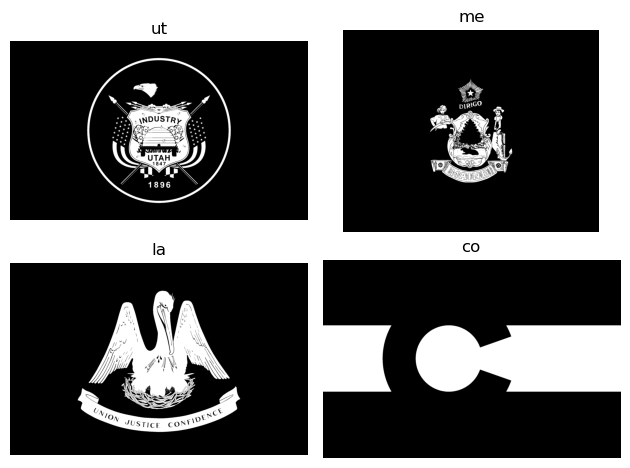

In [31]:
# Display four black-and-white flags in a 2x2 grid
def display_images(images, labels):
    fig, axis = plt.subplots(nrows =2, ncols=2)
    axis = axis.flatten()

    for img, label, axis in zip(images, labels, axis):
        #put it in grayscale
        axis.imshow(img, cmap='gray')
        axis.set_title(label)
        axis.axis('off')
    
    plt.tight_layout()
    plt.show()

folder = '/Users/catherinechu/mathematics-and-ai/weekly-projects/week5/flags'
images, labels = load_images(folder)
display_images(images, labels)

    

### Part 2.2: SVMs for flag pixel data
The function `sample_pixels` samples a pixel from a given image uniformly at random. 

1. Use the `sample_pixels`  function to generate synthetic data sets of pixels from for a flag image.
2. Update the `kernel_comparison` function so that if `if_flag` is `True` the decision boundaries are plotted in a 2x2 grid of subplots with plot ranges matching the height and width of the flags.
3. Show the results of the kernel comparison for the four flags that your previously selected. Use the highest values of `degree` and `gamma` that still run *reasonably fast* on your laptop.
4. Adjust your code so that you can run the quantitative part (i.e., the calculation of train and test accuracy) without plotting the decision boundaries. Run the adjusted code on all flags to indentify for each kernel the flags that yield to best easiest-to-classify and hardest-to-classify data sets. Test how the number of of pixels sampled affects your results.

In [32]:
def sample_pixels(image, num_samples=100):
    pixel_data = []
    pixel_labels = []
    height, width = image.shape
    for _ in range(num_samples):
        x1 = random.randint(0, width - 1)
        x2 = random.randint(0, height - 1)
        pixel_data.append([x1/width-0.5, x2/width-0.5])
        pixel_labels.append(image[x2,x1])
    return np.array(pixel_data), np.array(pixel_labels, dtype=int)

/Users/catherinechu/anaconda3/envs/mathai/lib/python3.11/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Kernel comparison for ut


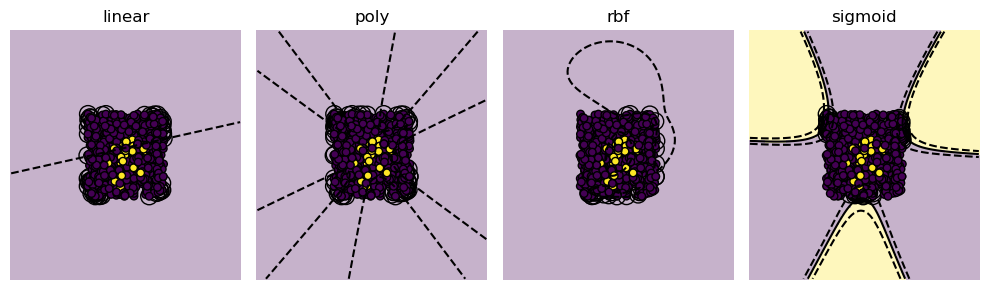

Kernel comparison for me


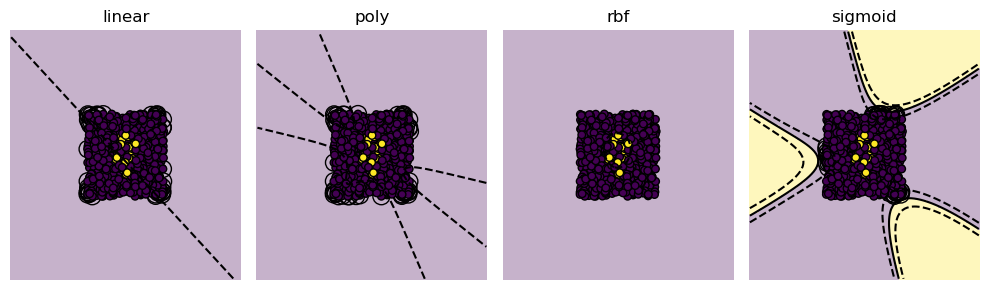

Kernel comparison for la


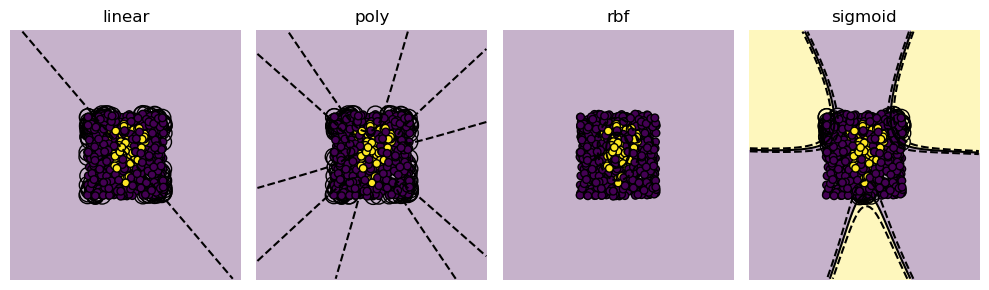

Kernel comparison for co


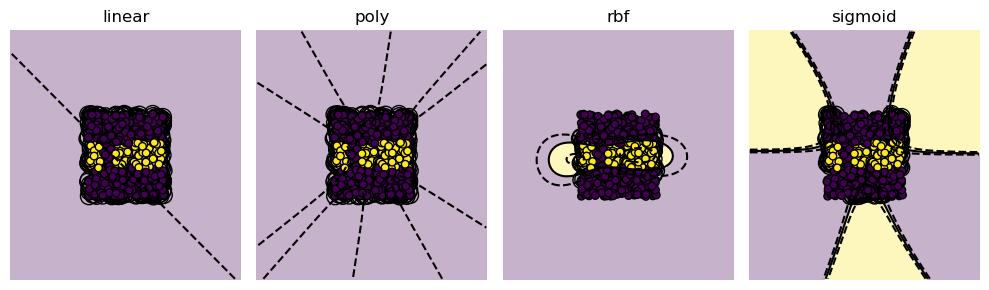

Kernel comparison for nh


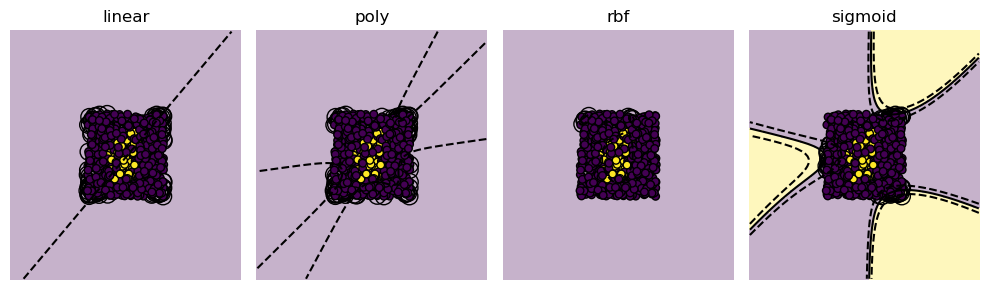

Kernel comparison for ms


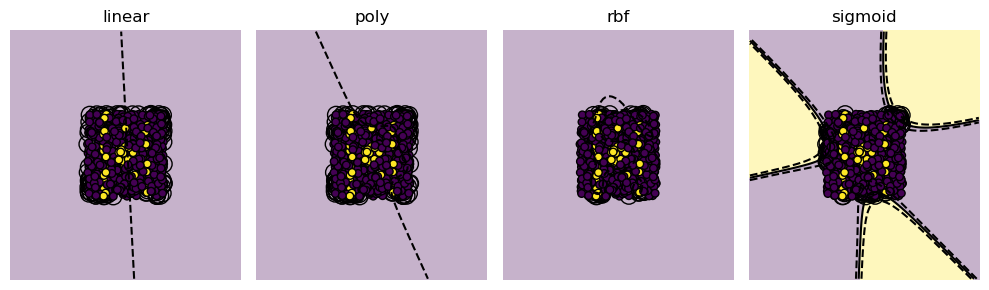

Kernel comparison for md


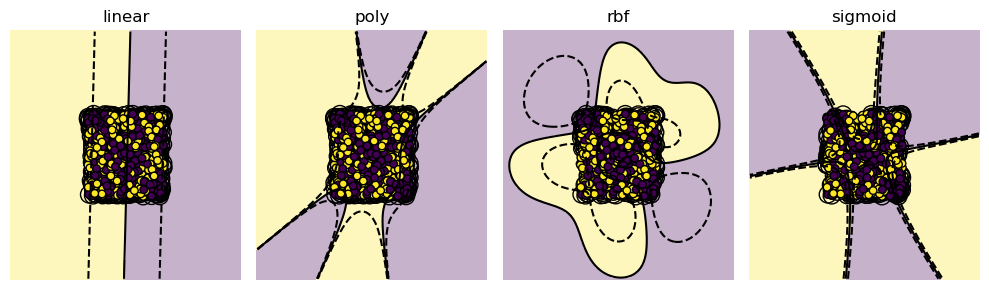

Kernel comparison for nj


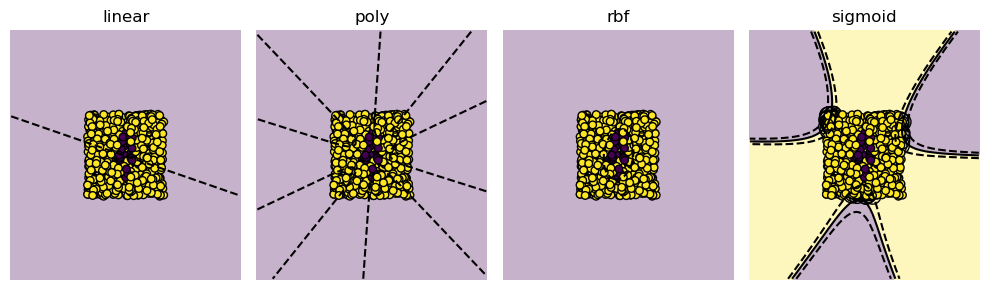

Kernel comparison for ar


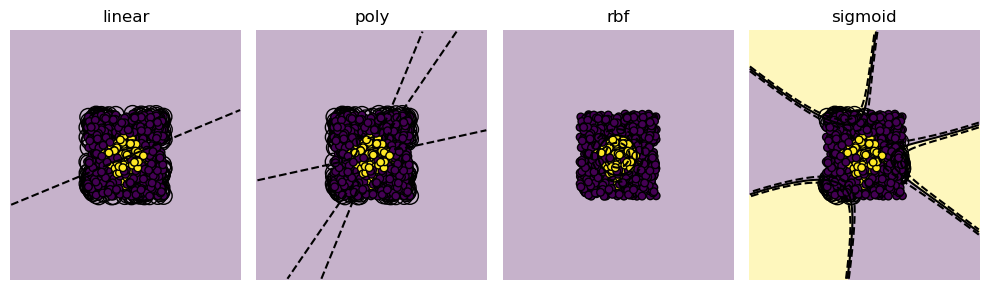

Kernel comparison for wi


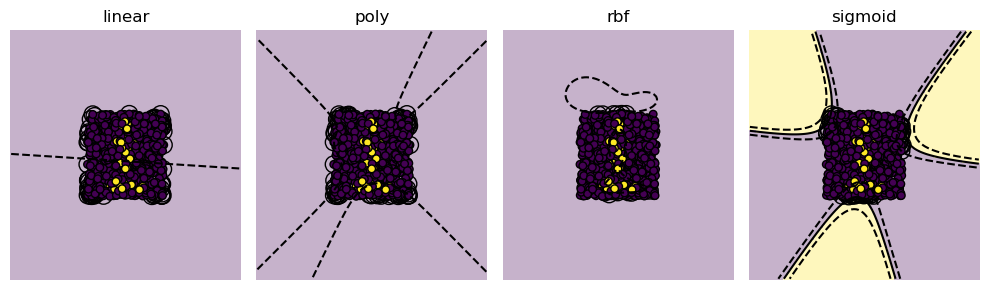

Kernel comparison for ok


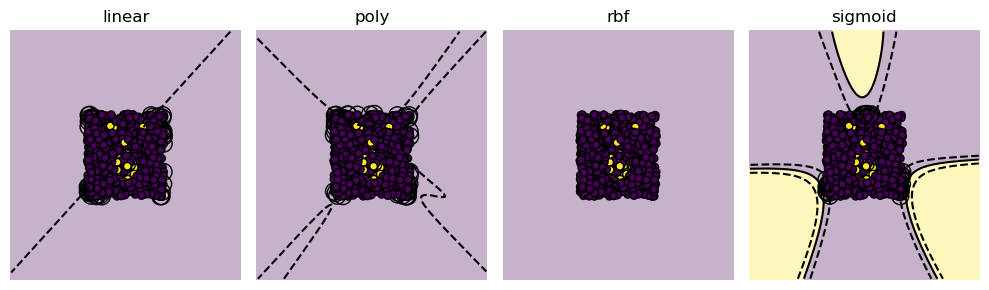

Kernel comparison for mt


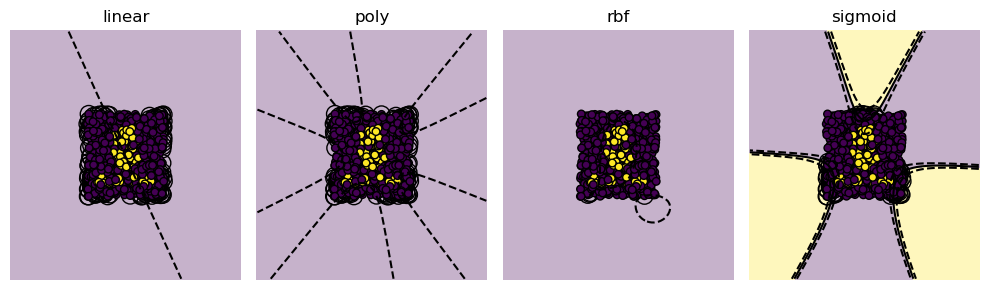

Kernel comparison for ny


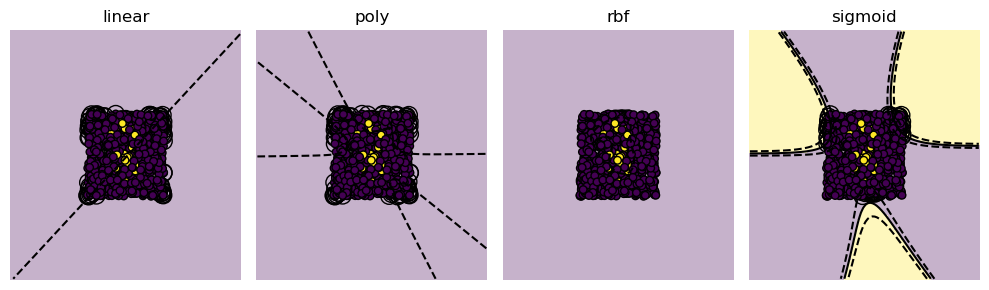

Kernel comparison for wy


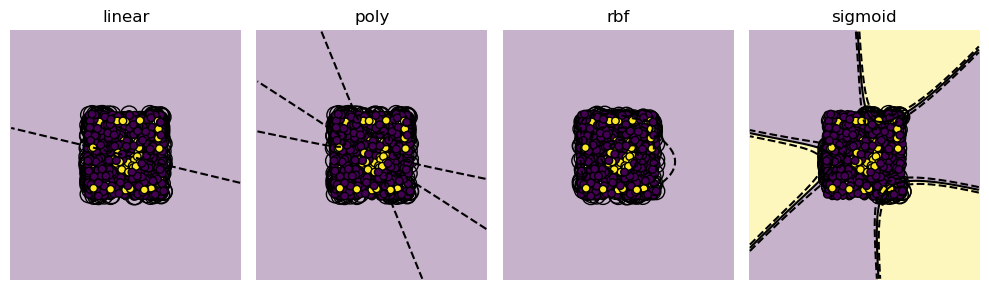

Kernel comparison for oh


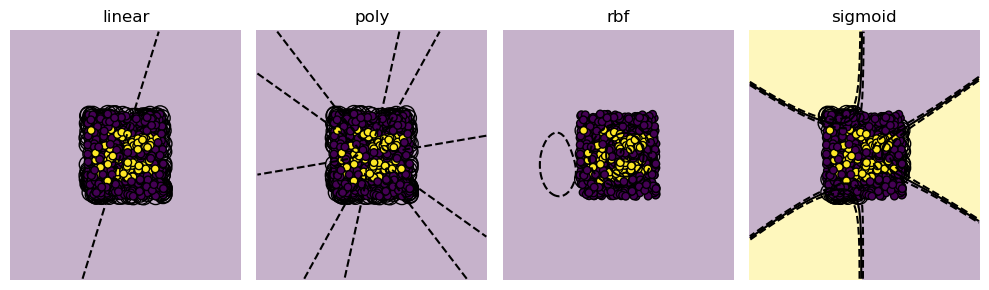

Kernel comparison for ma


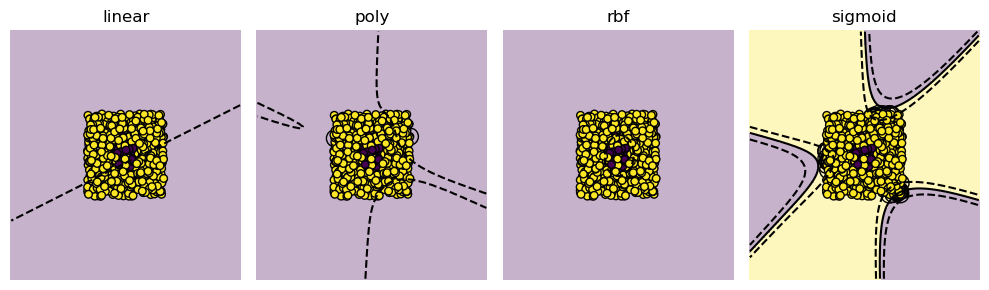

Kernel comparison for nm


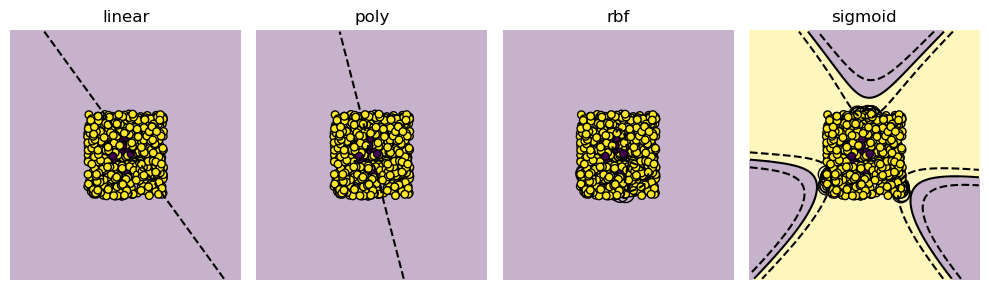

Kernel comparison for in


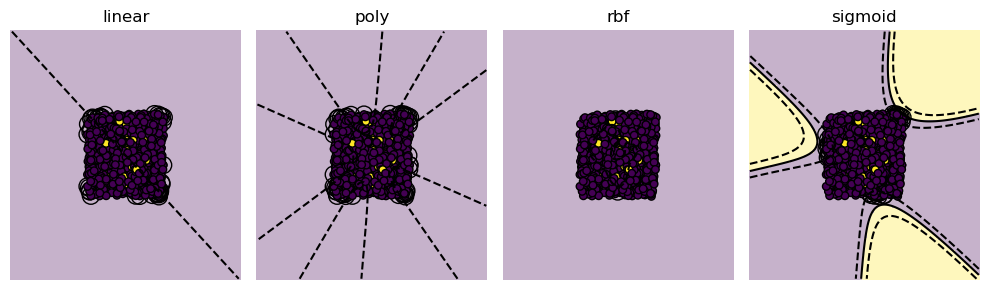

Kernel comparison for sc


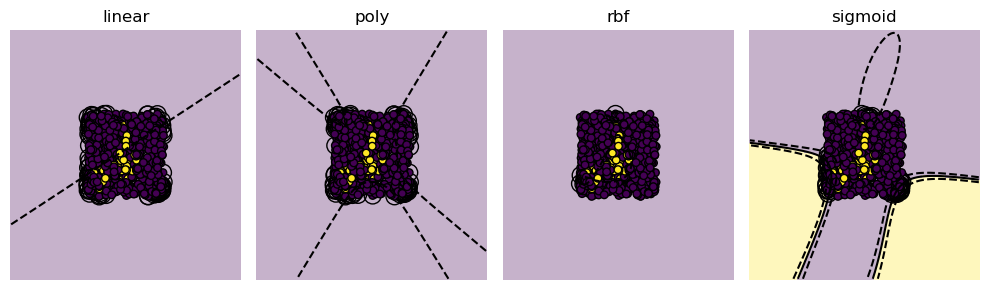

Kernel comparison for hi


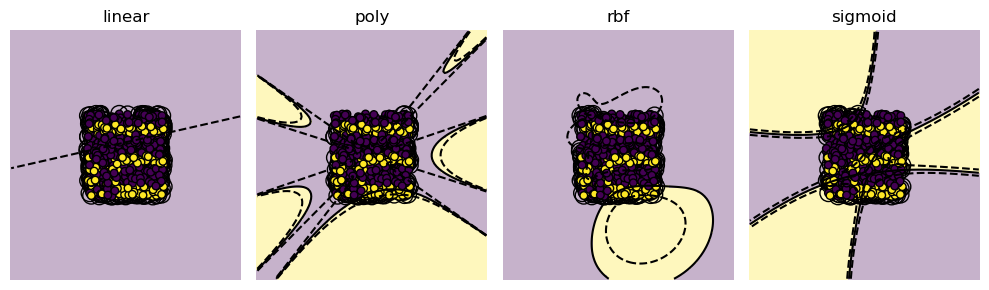

Kernel comparison for ks


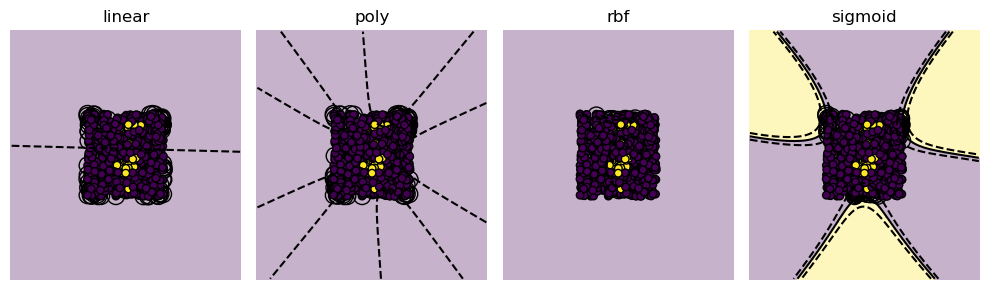

Kernel comparison for il


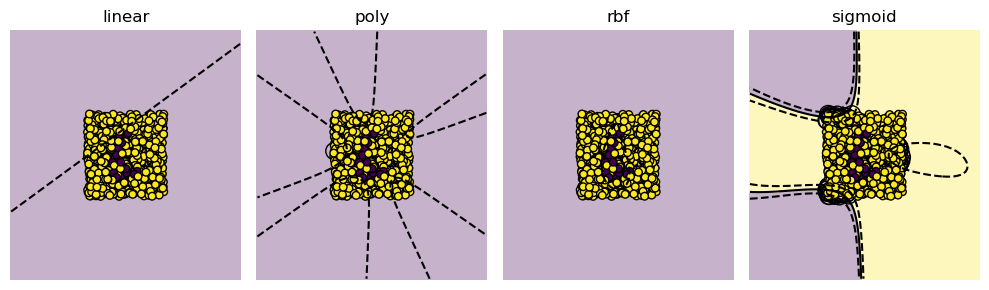

Kernel comparison for ga


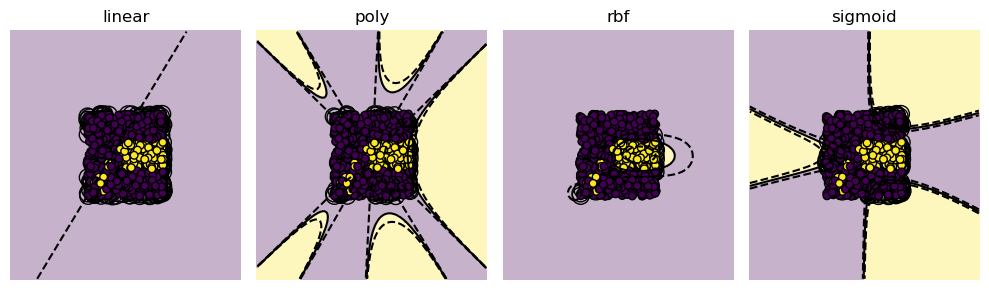

Kernel comparison for sd


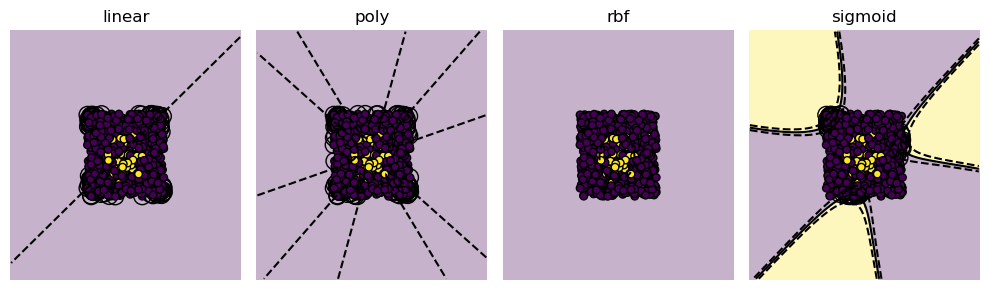

Kernel comparison for ky


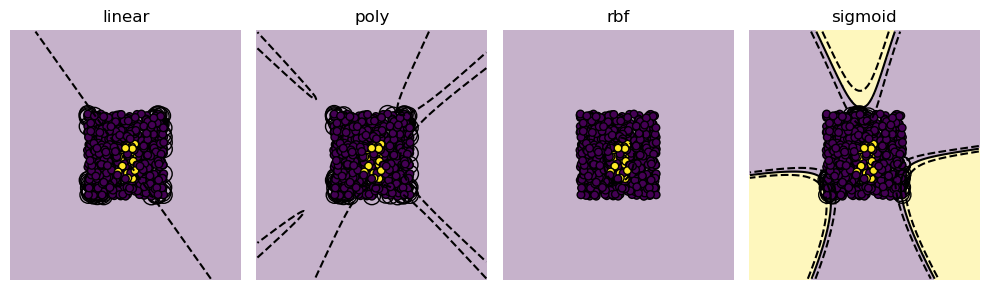

Kernel comparison for id


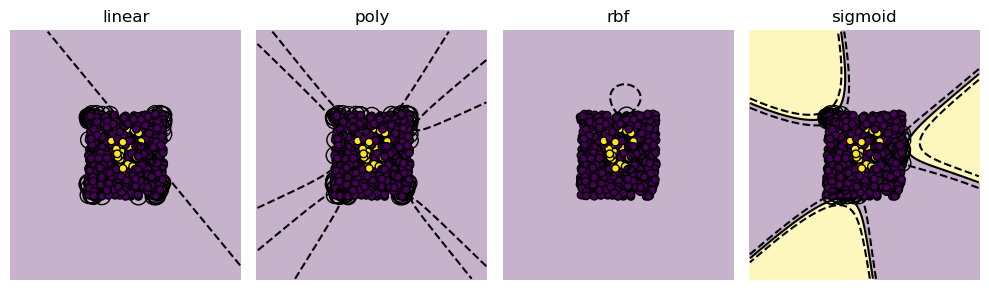

Kernel comparison for ia


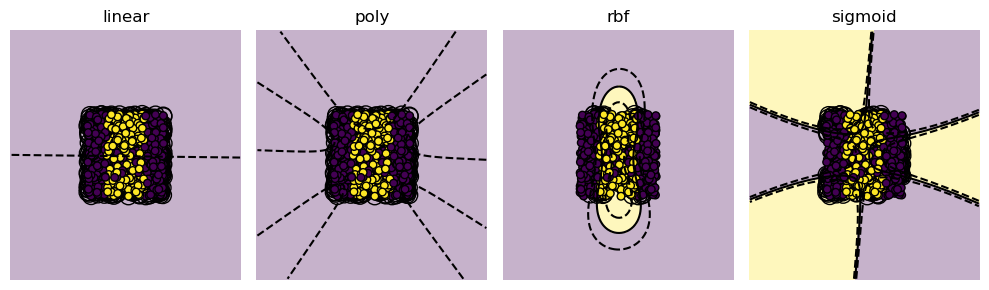

Kernel comparison for de


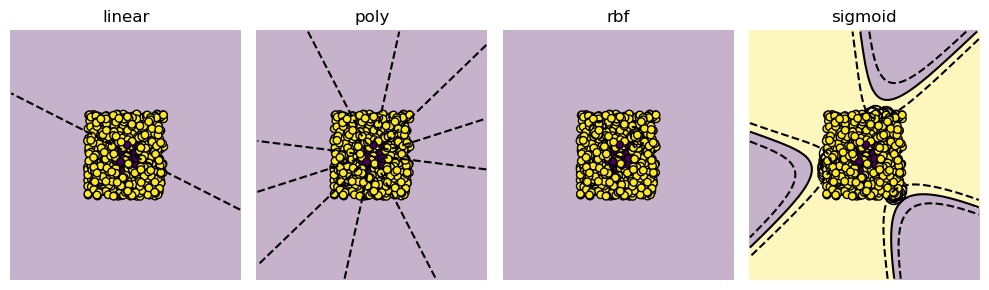

Kernel comparison for fl


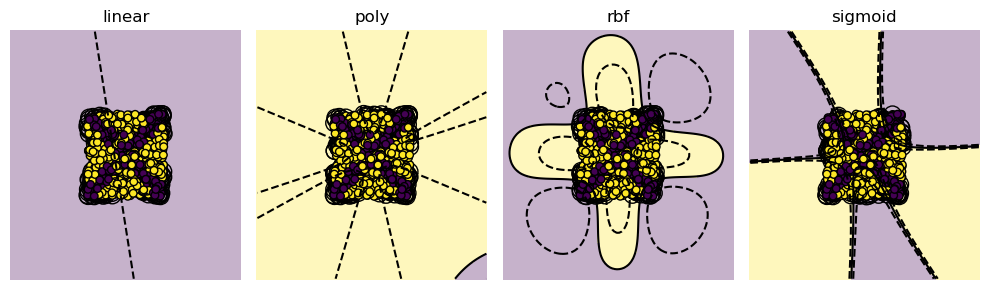

Kernel comparison for pa


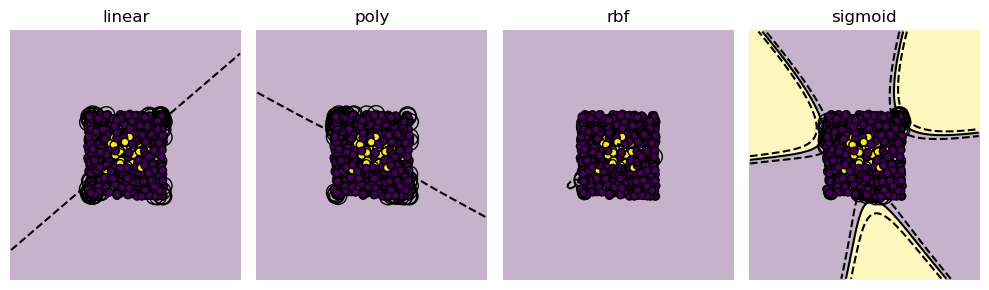

Kernel comparison for ri


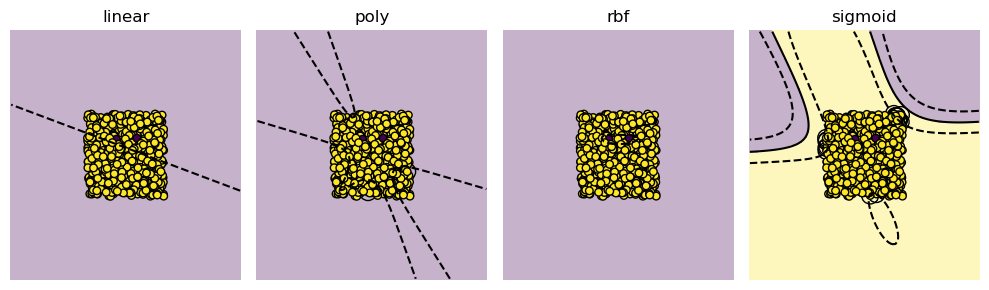

Kernel comparison for tn


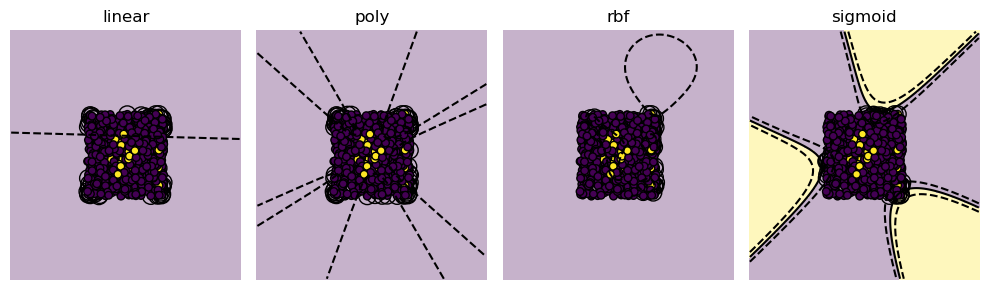

Kernel comparison for nv


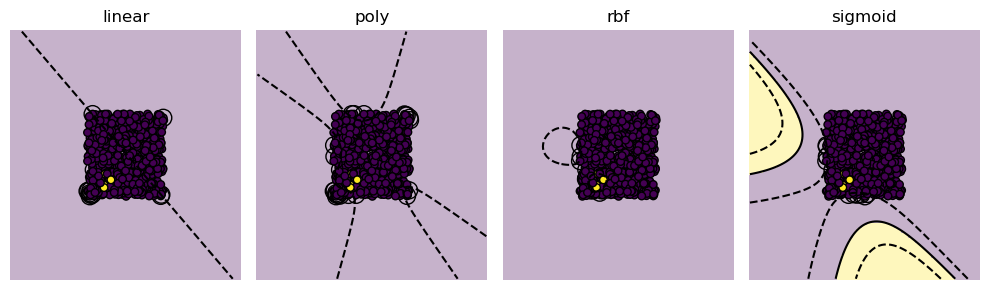

Kernel comparison for or


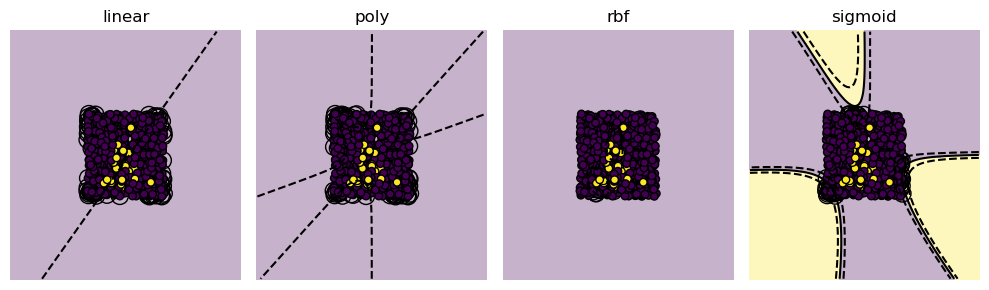

Kernel comparison for tx


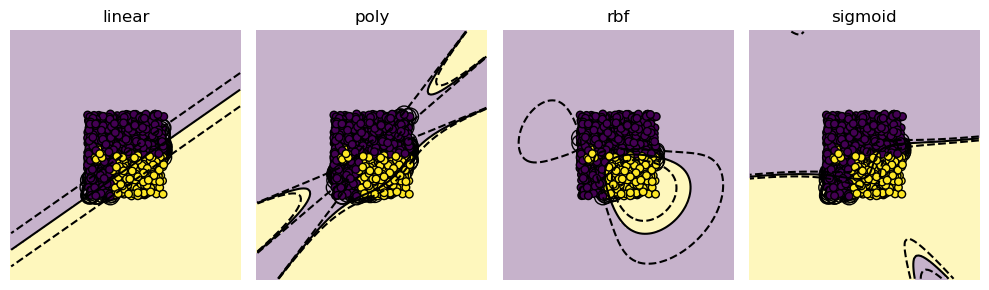

Kernel comparison for wa


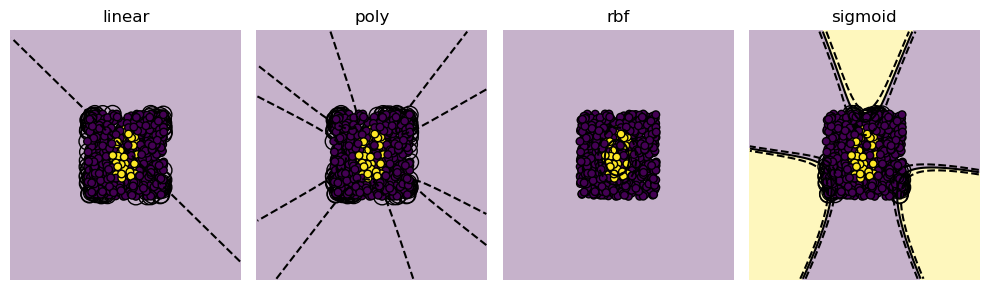

Kernel comparison for wv


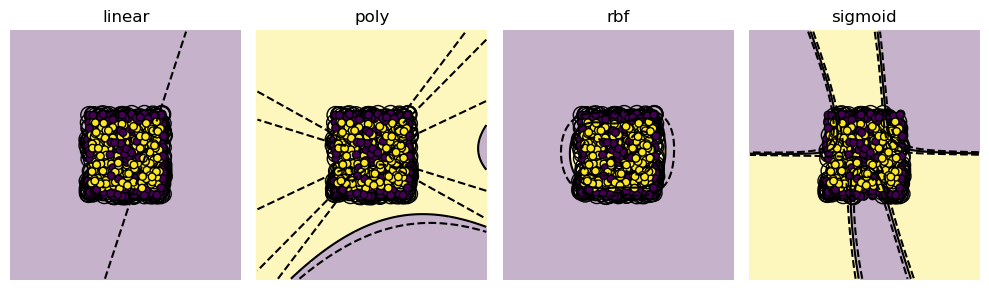

Kernel comparison for nc


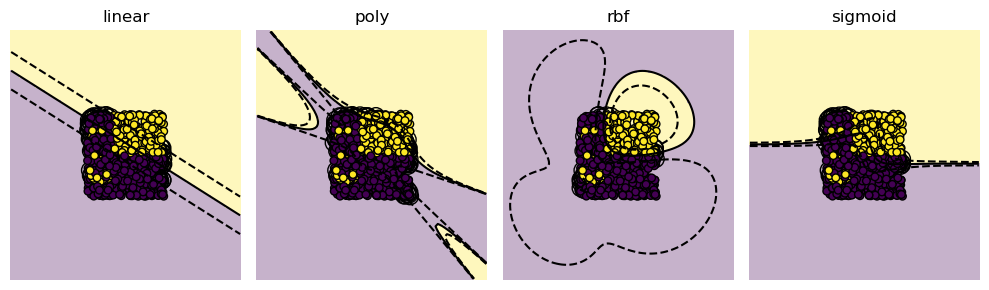

Kernel comparison for mo


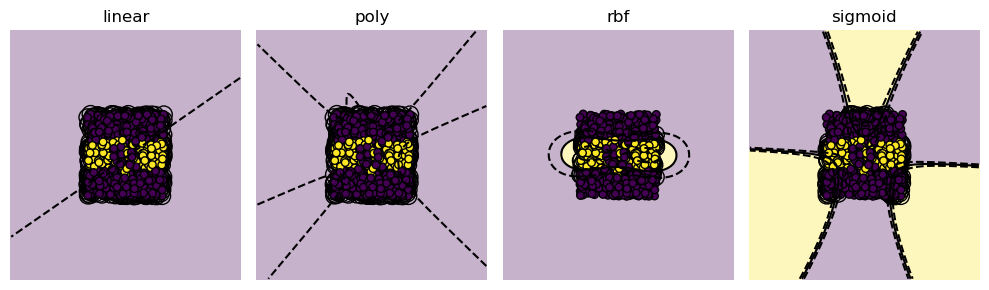

Kernel comparison for al


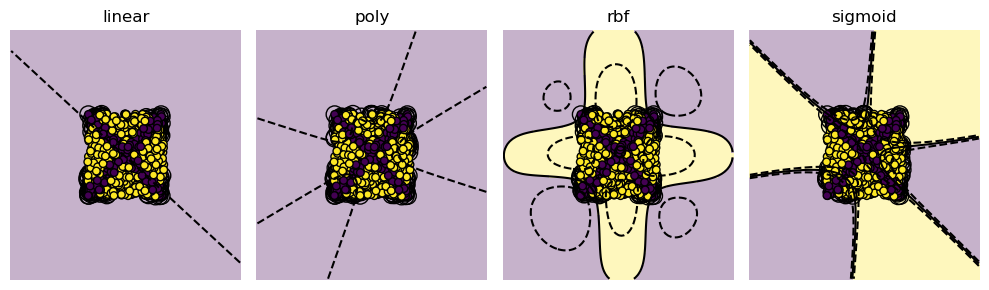

Kernel comparison for az


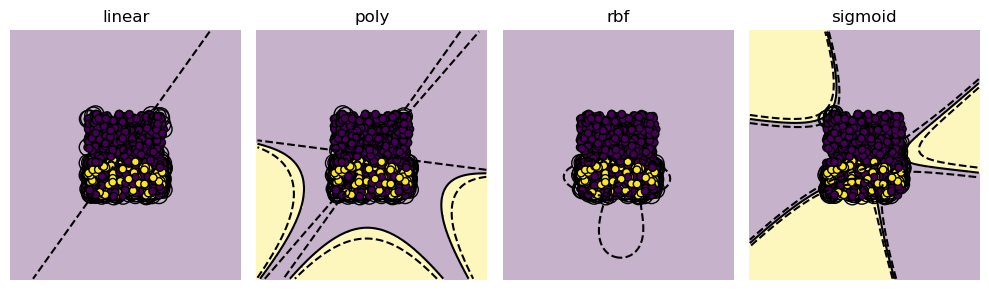

Kernel comparison for mn


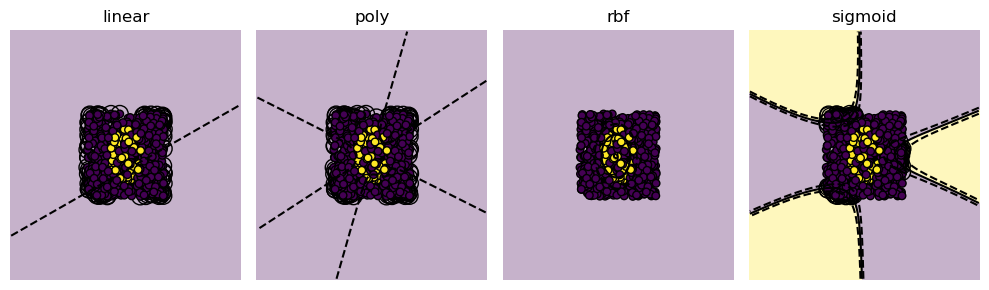

Kernel comparison for ca


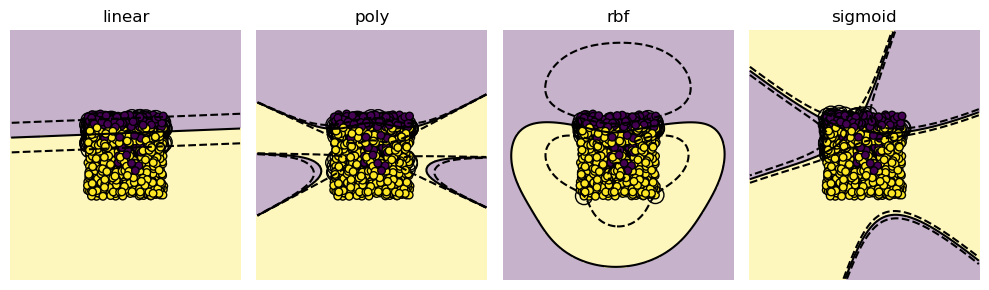

Kernel comparison for va


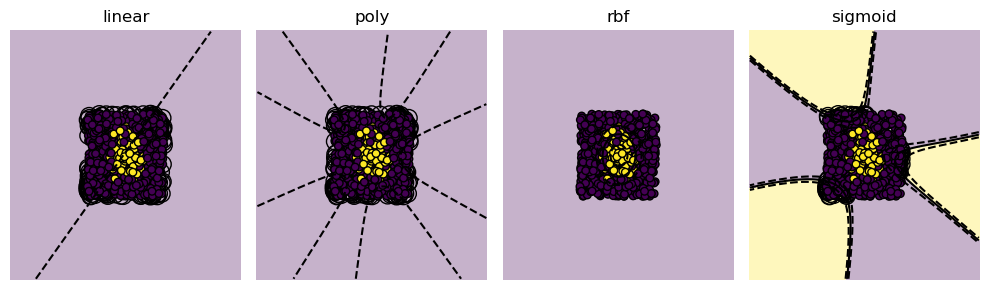

Kernel comparison for vt


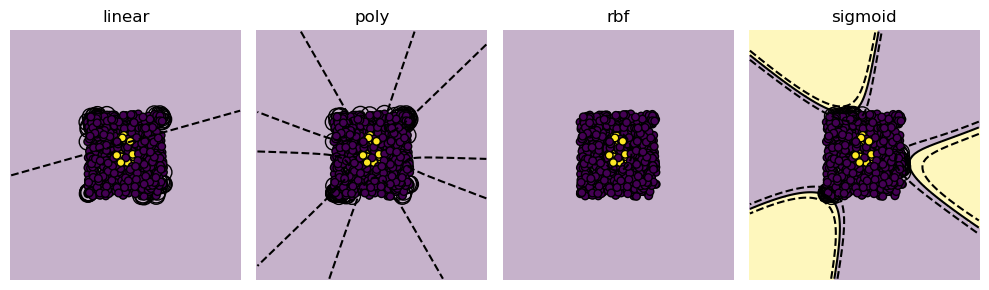

Kernel comparison for mi


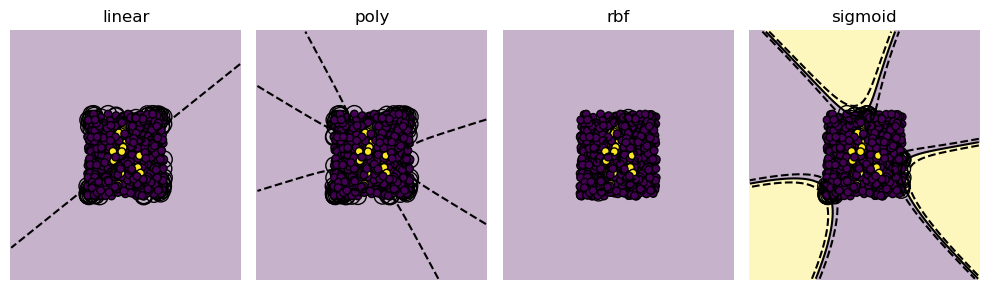

Kernel comparison for ne


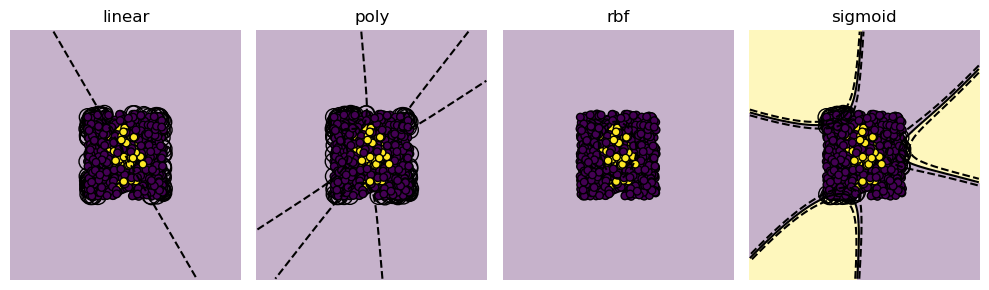

Kernel comparison for ak


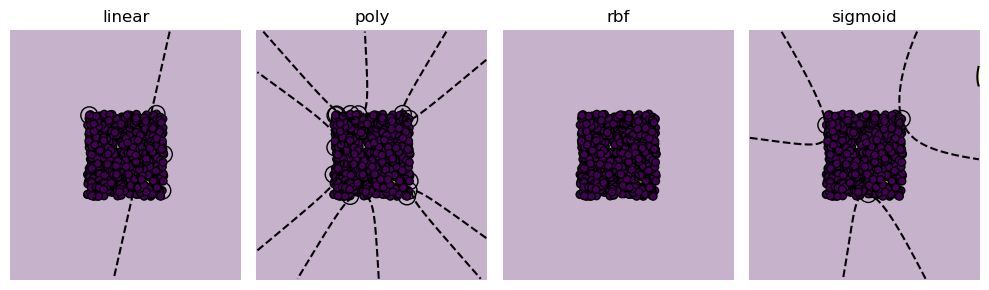

Kernel comparison for ct


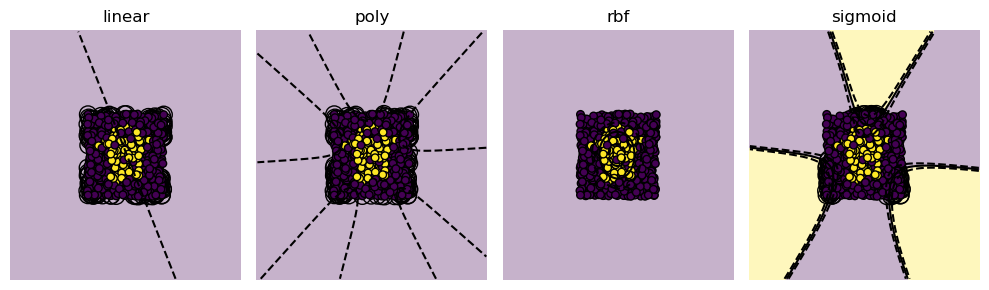

Kernel comparison for nd


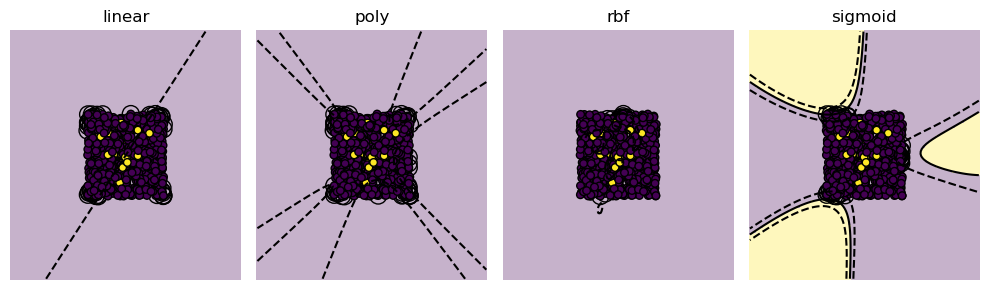

In [41]:
# Visual kernel comparison for selected flags
images, labels = load_images('/Users/catherinechu/mathematics-and-ai/weekly-projects/week5/flags')

# Sample pixels from each image
for img, label in zip(images, labels):
    X, y = sample_pixels(img, num_samples=700)
    print(f"Kernel comparison for {label}")
    kernel_comparison(X, y, if_flag=True)

/Users/catherinechu/anaconda3/envs/mathai/lib/python3.11/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Kernel comparison for ut


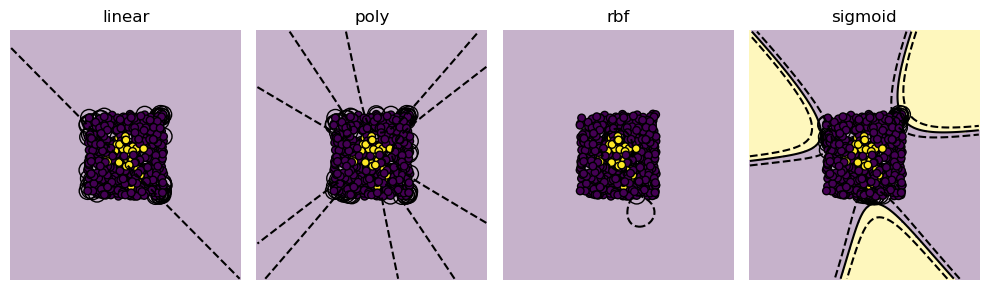

Kernel comparison for me


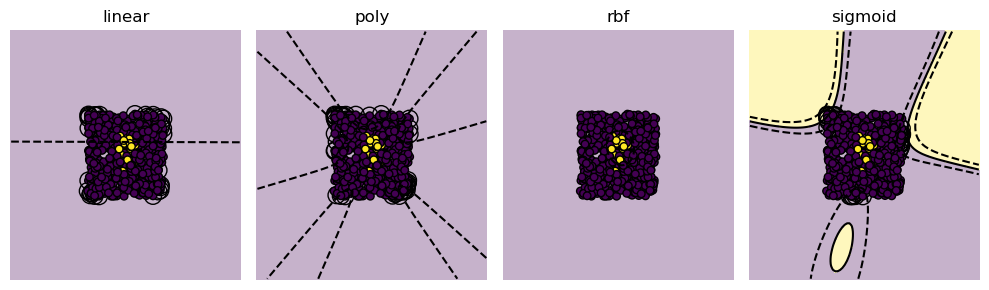

Kernel comparison for la


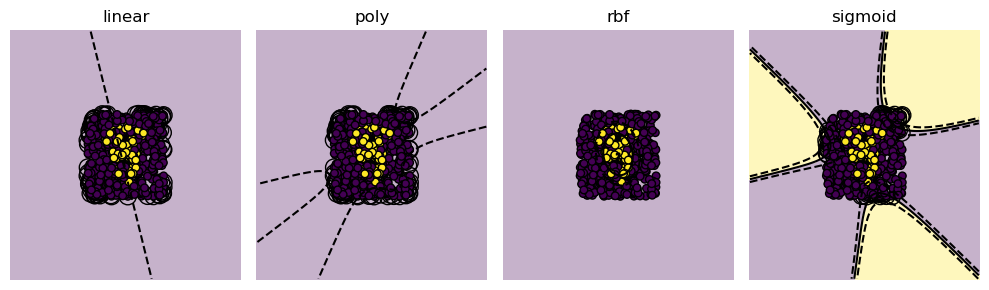

Kernel comparison for co


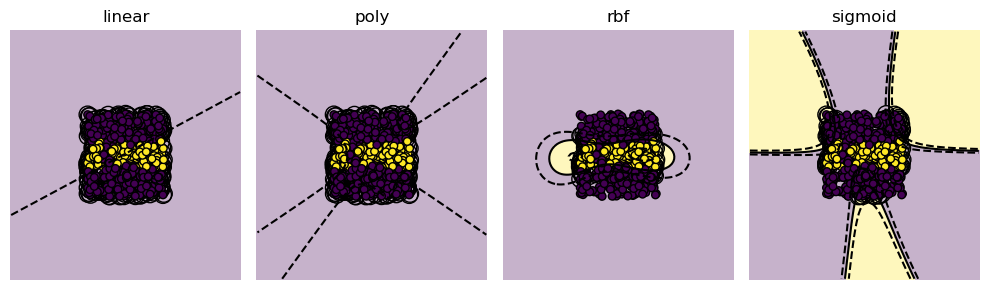

Kernel comparison for nh


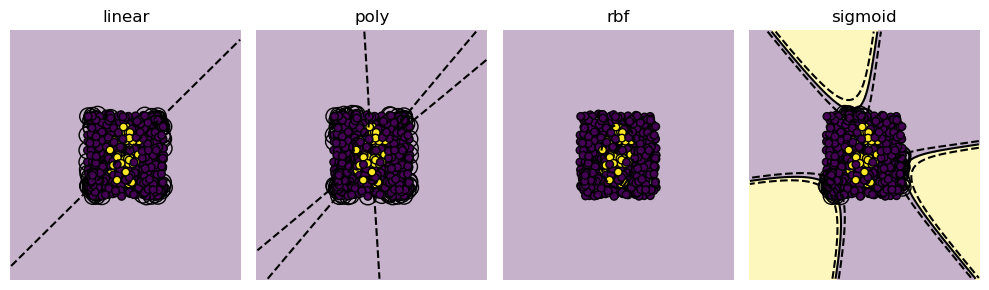

Kernel comparison for ms


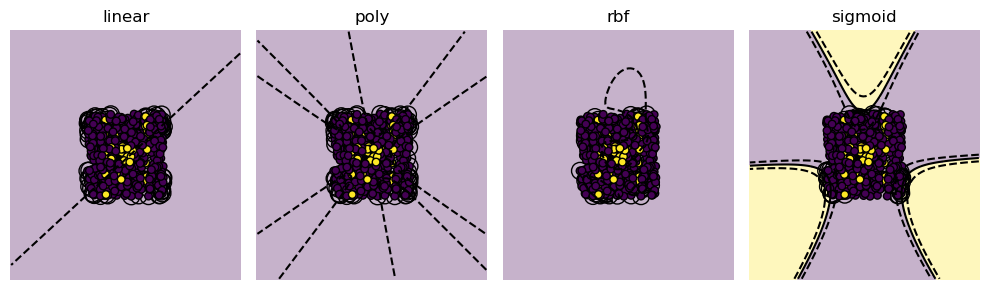

Kernel comparison for md


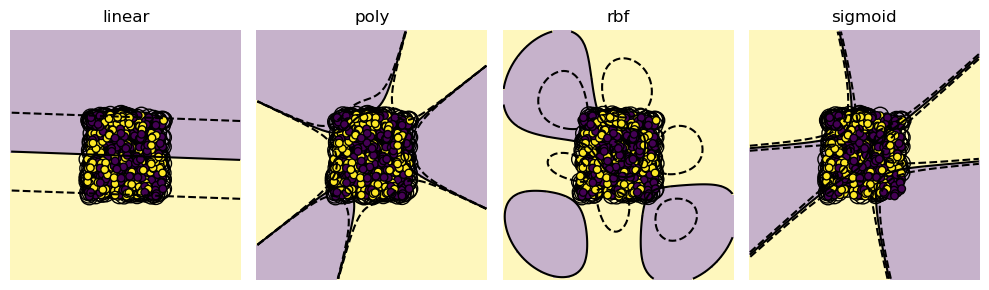

Kernel comparison for nj


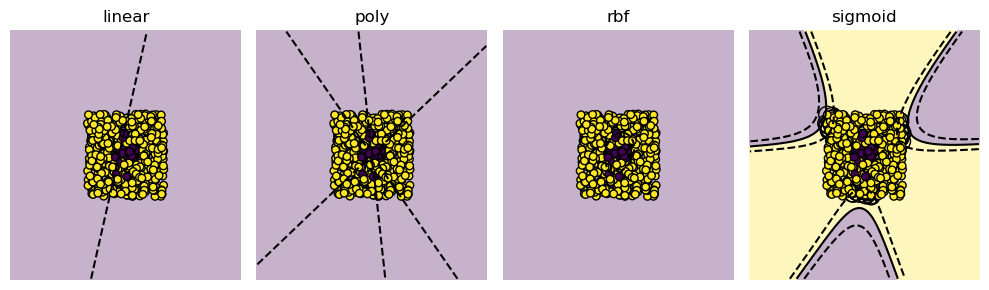

Kernel comparison for ar


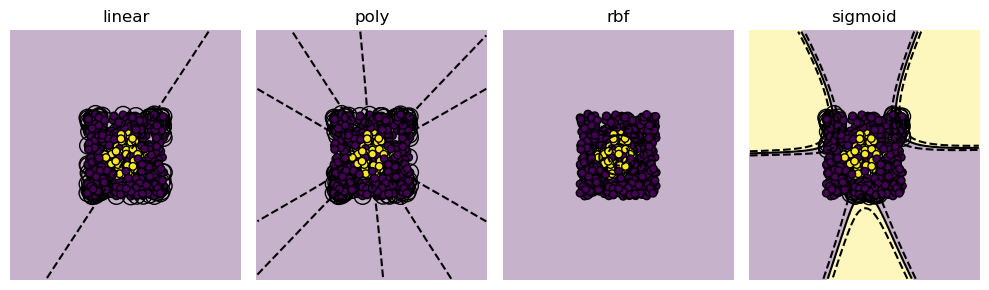

Kernel comparison for wi


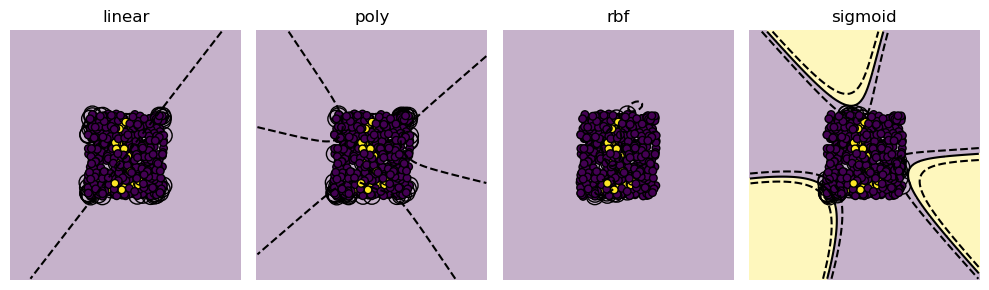

Kernel comparison for ok


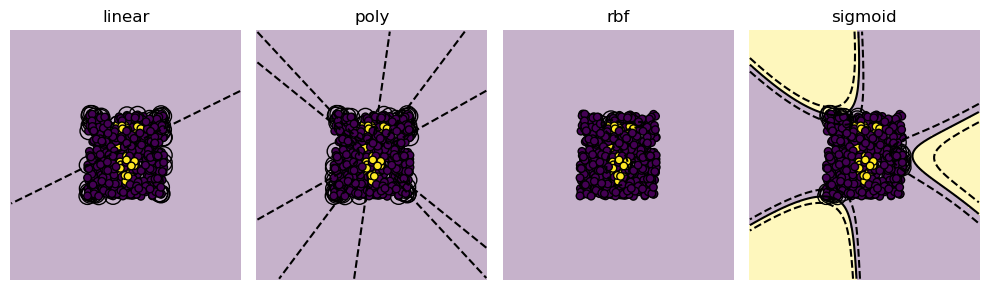

Kernel comparison for mt


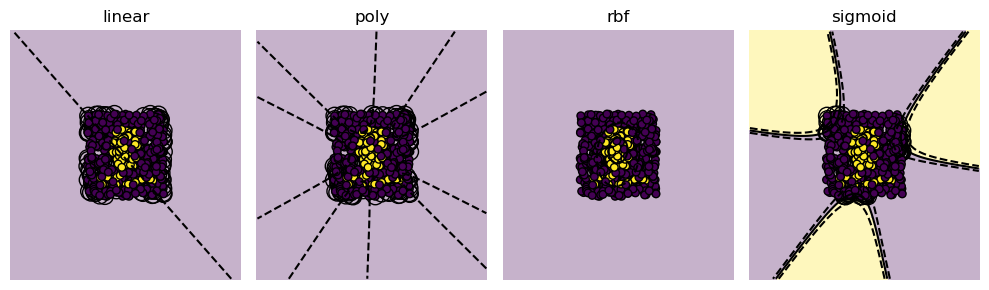

Kernel comparison for ny


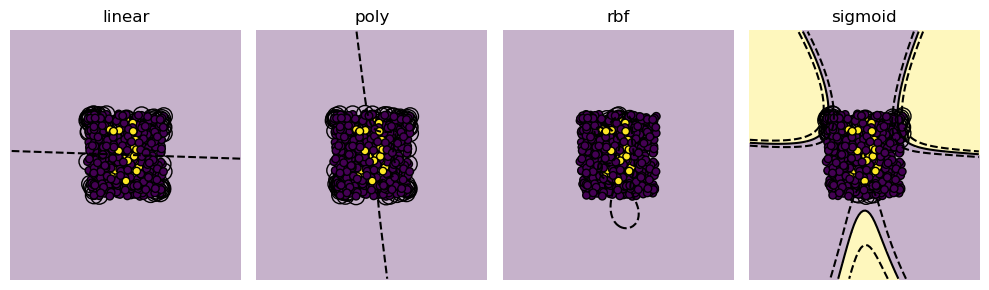

Kernel comparison for wy


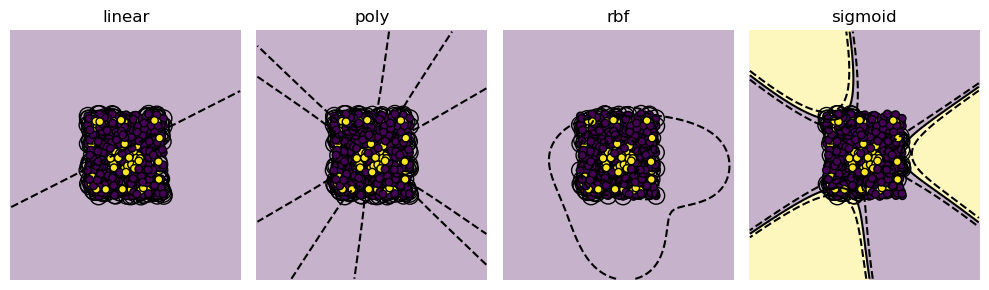

Kernel comparison for oh


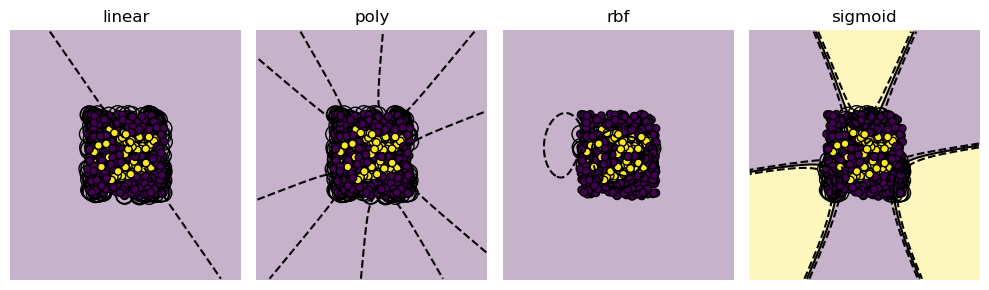

Kernel comparison for ma


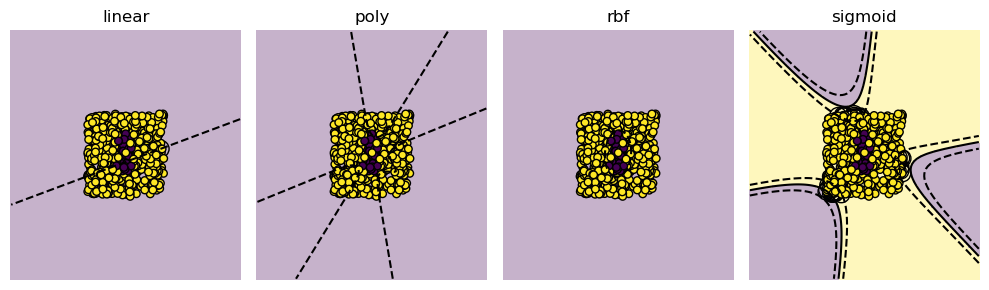

Kernel comparison for nm


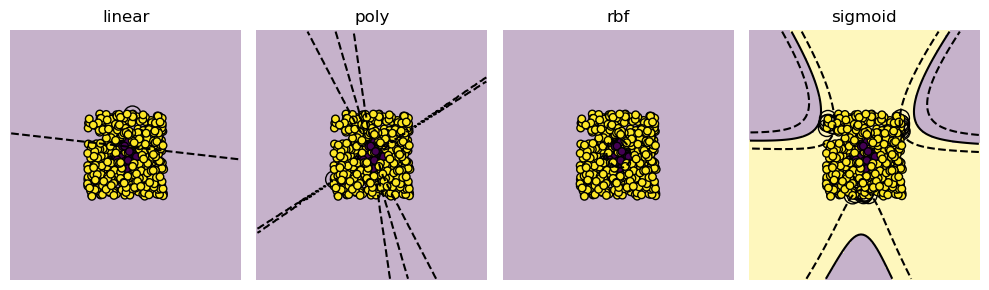

Kernel comparison for in


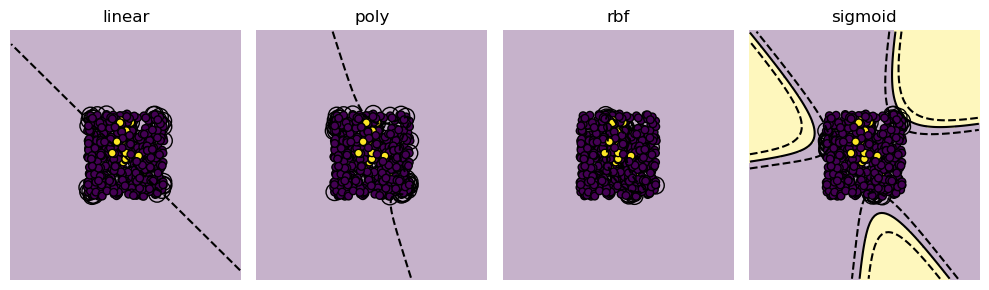

Kernel comparison for sc


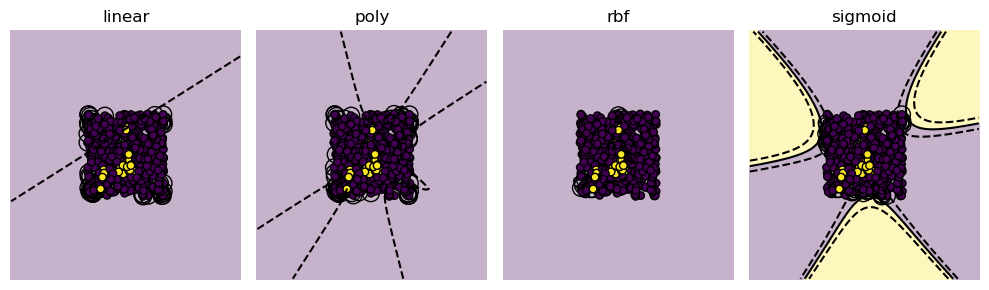

Kernel comparison for hi


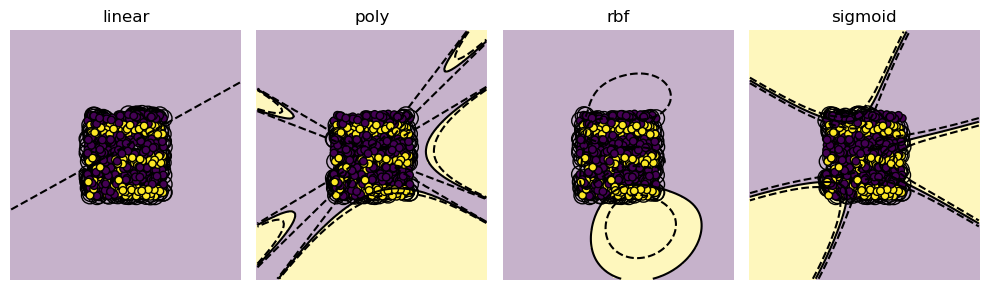

Kernel comparison for ks


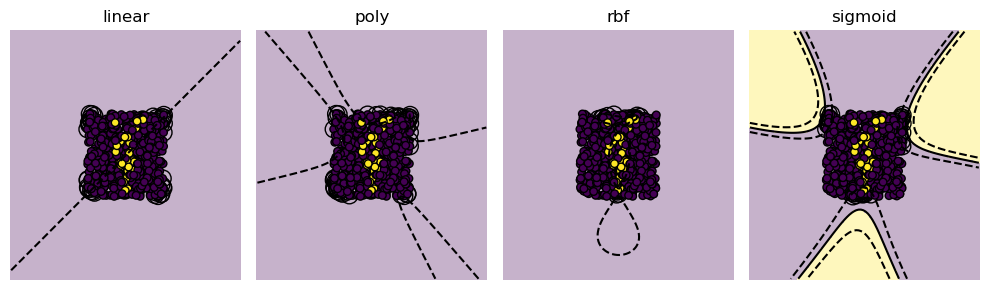

Kernel comparison for il


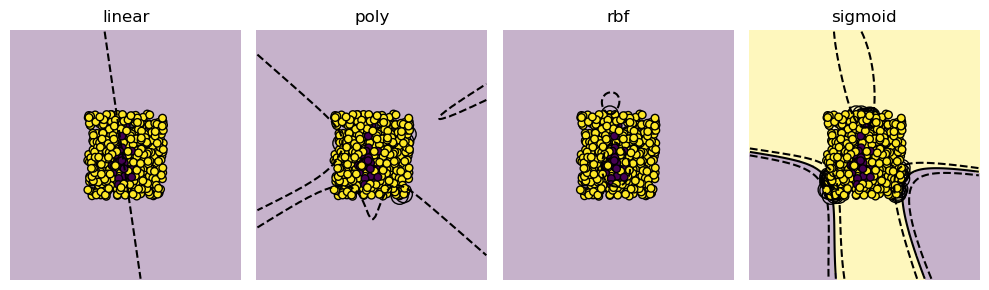

Kernel comparison for ga


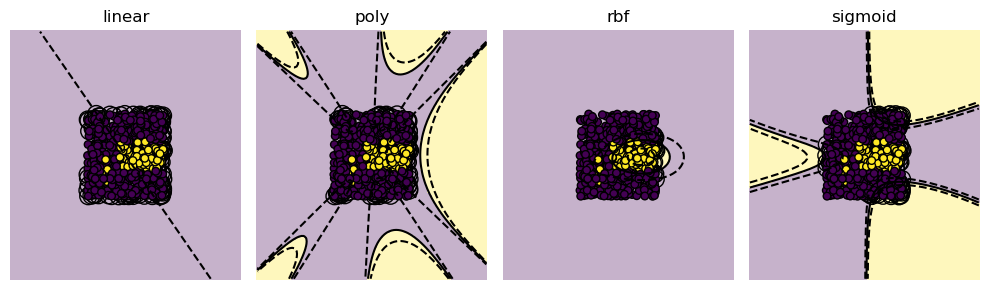

Kernel comparison for sd


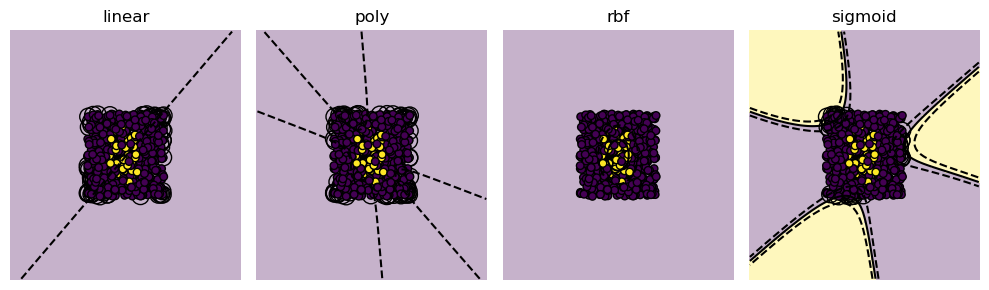

Kernel comparison for ky


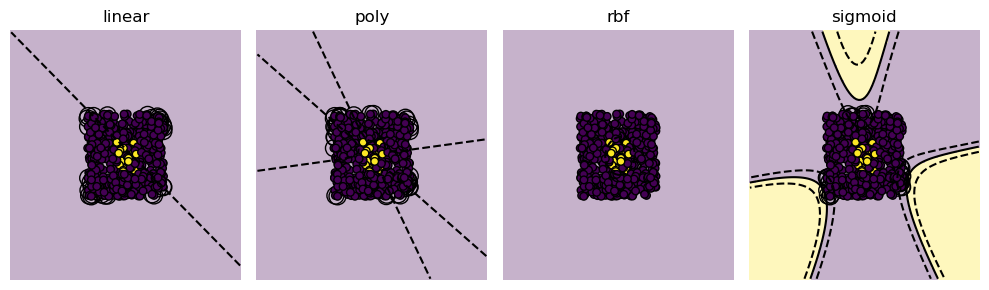

Kernel comparison for id


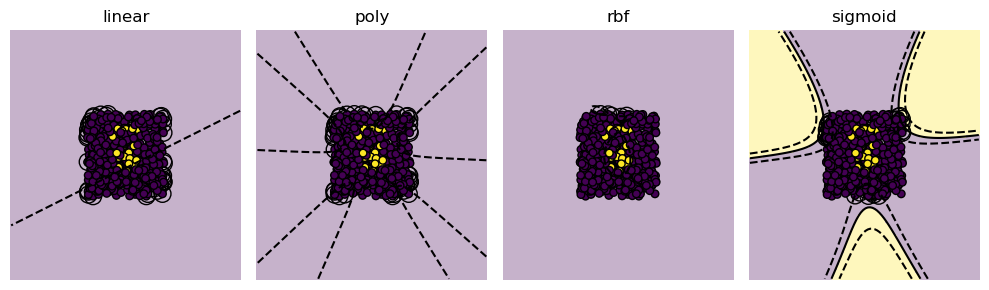

Kernel comparison for ia


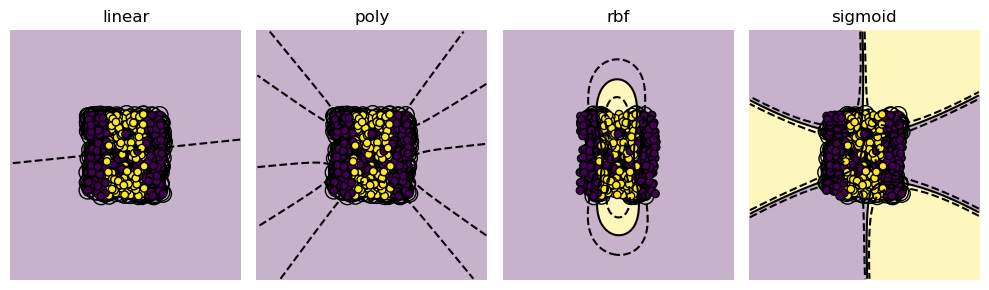

Kernel comparison for de


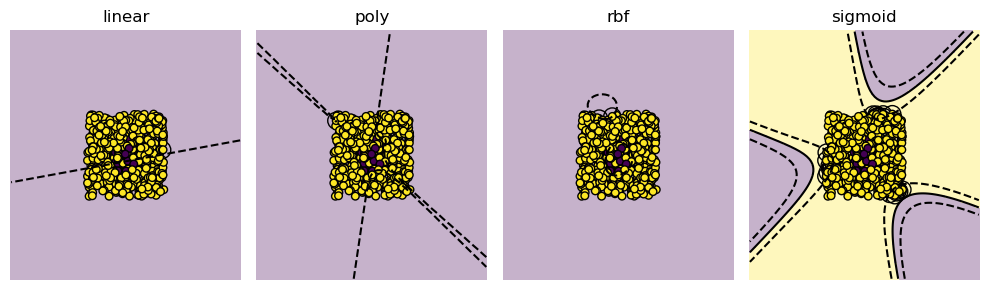

Kernel comparison for fl


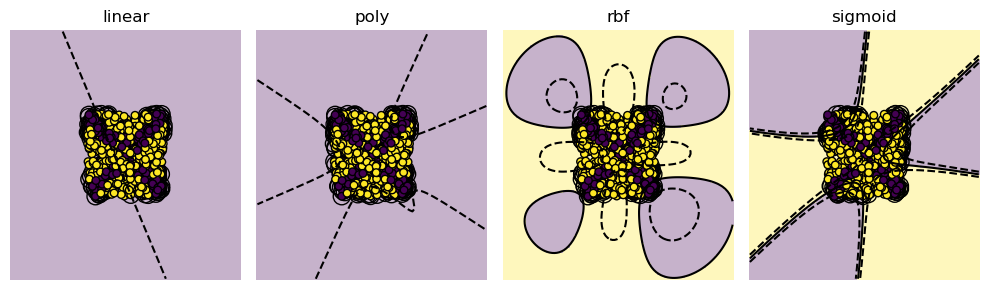

Kernel comparison for pa


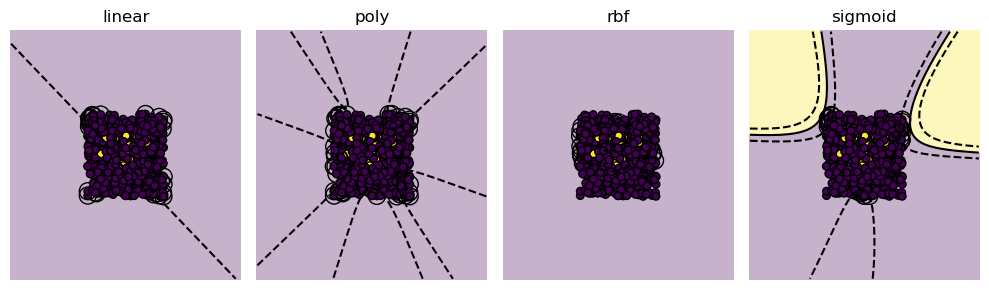

Kernel comparison for ri


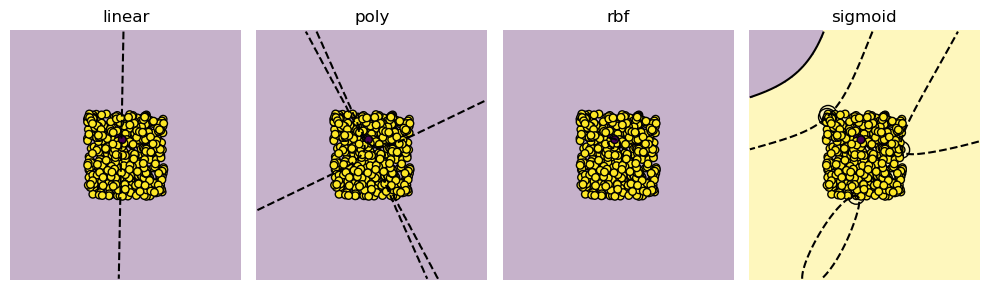

Kernel comparison for tn


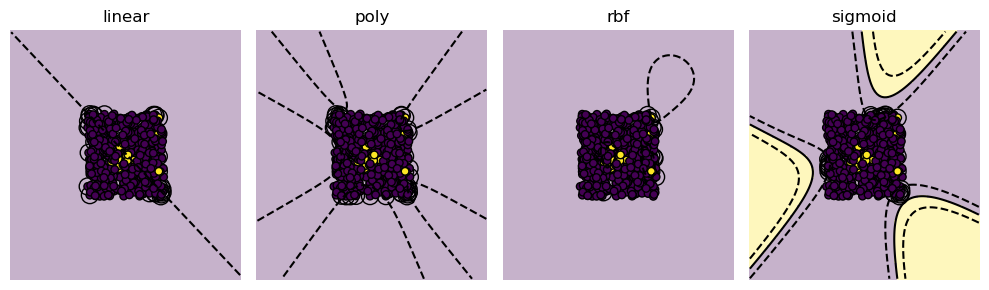

Kernel comparison for nv


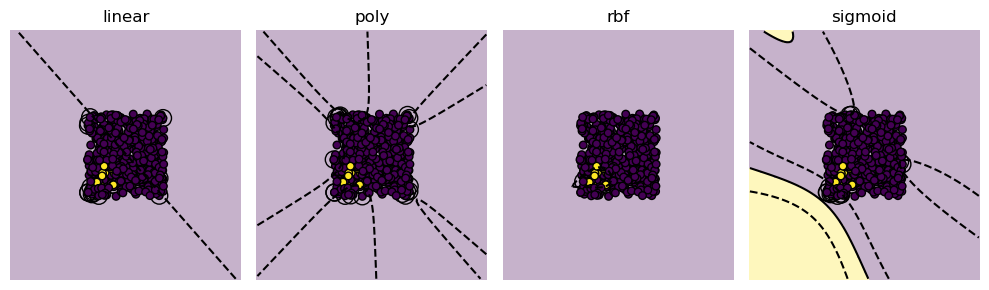

Kernel comparison for or


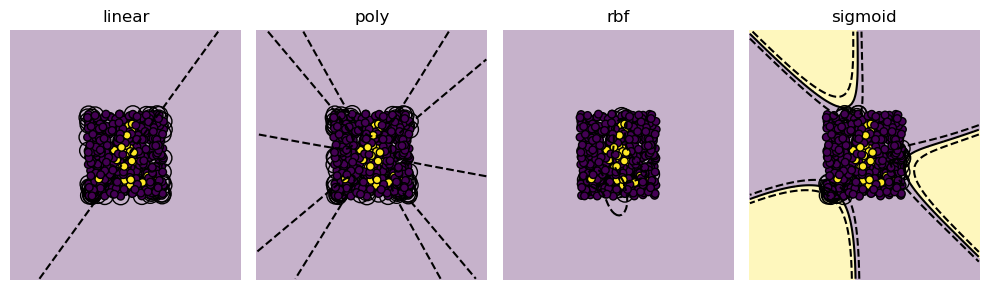

Kernel comparison for tx


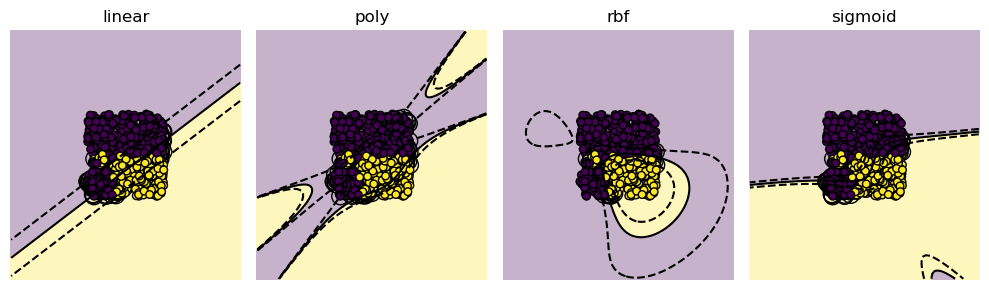

Kernel comparison for wa


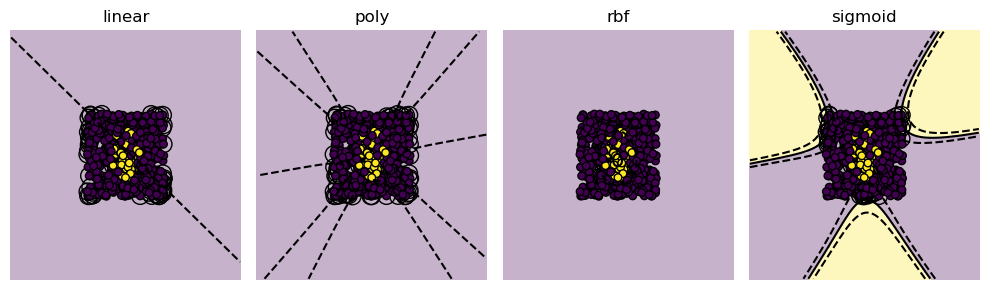

Kernel comparison for wv


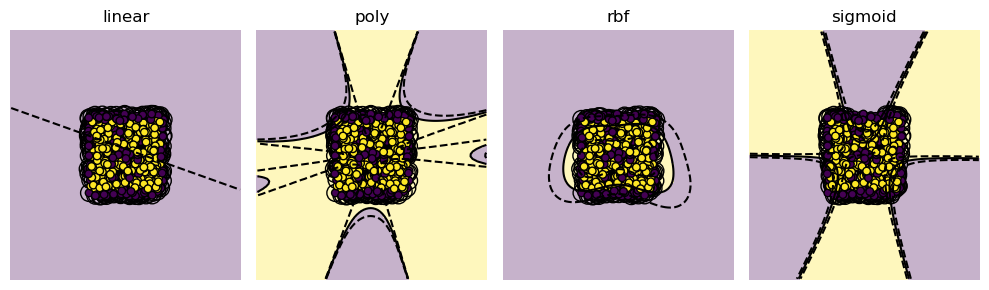

Kernel comparison for nc


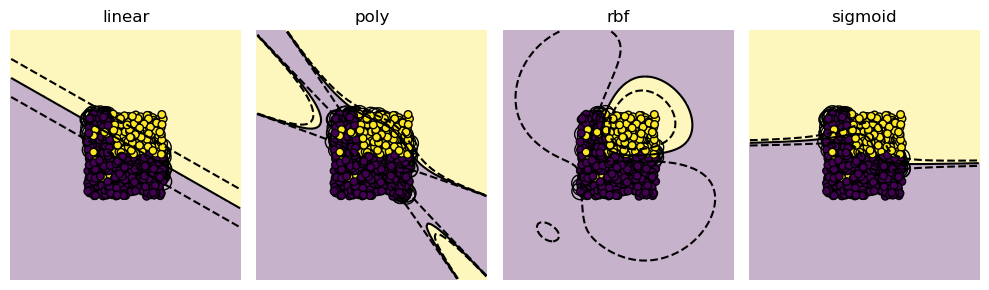

Kernel comparison for mo


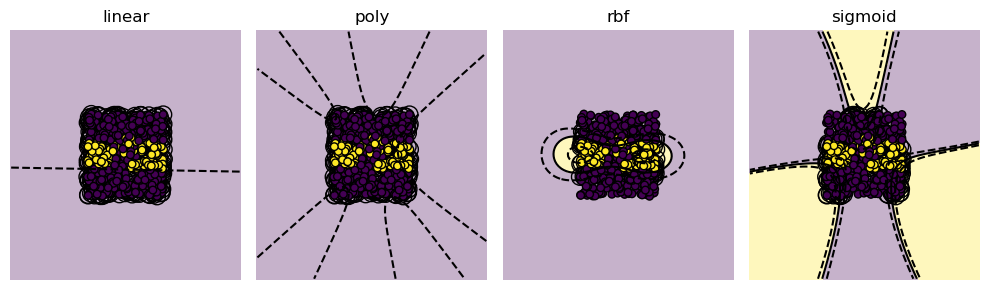

Kernel comparison for al


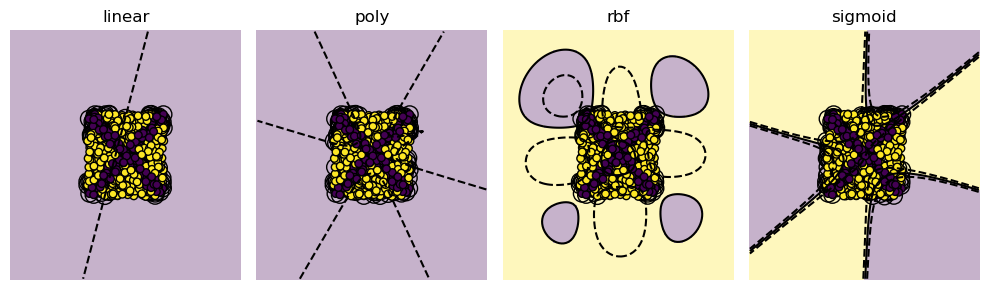

Kernel comparison for az


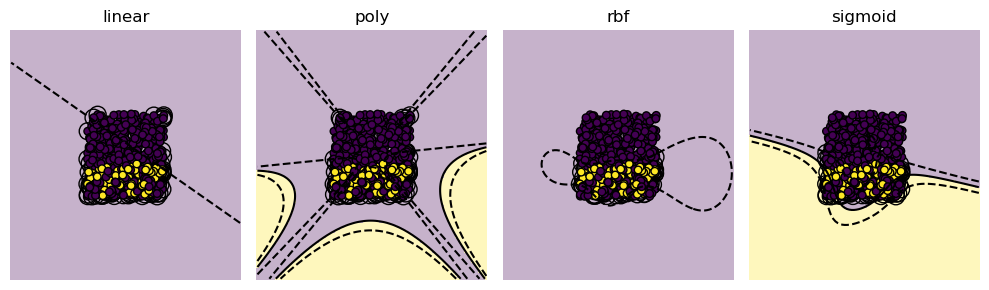

Kernel comparison for mn


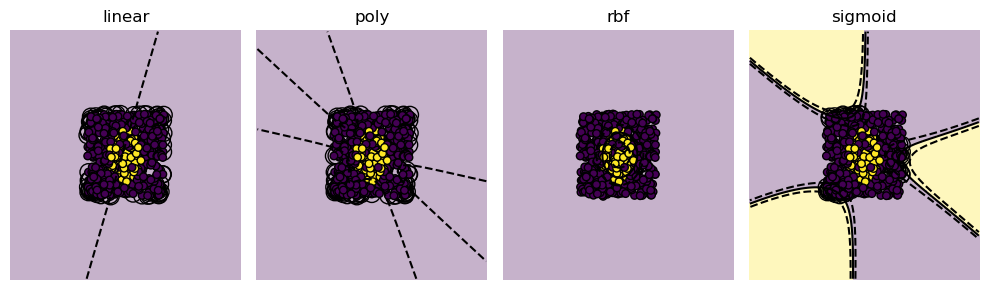

Kernel comparison for ca


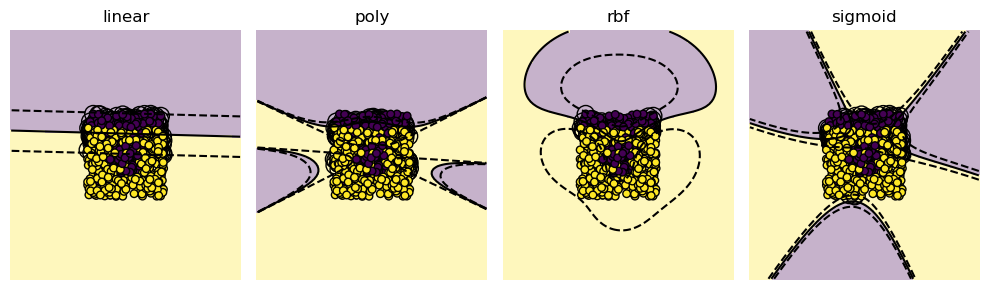

Kernel comparison for va


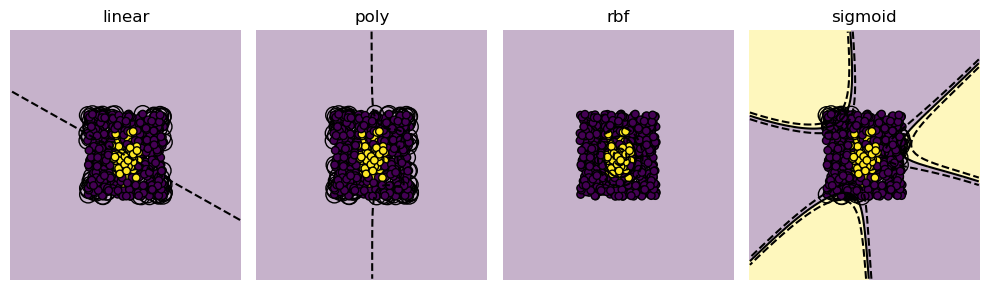

Kernel comparison for vt


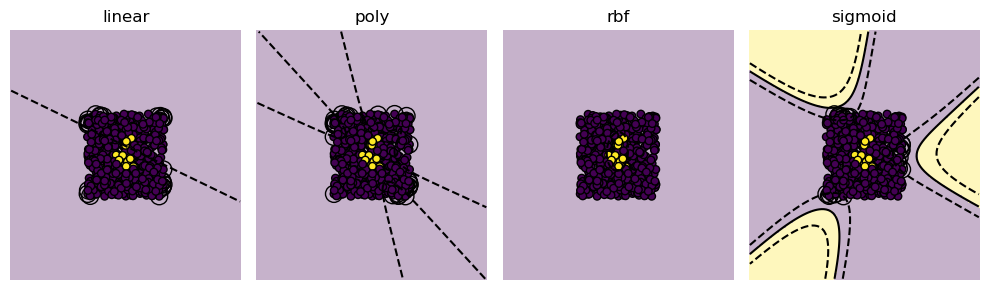

Kernel comparison for mi


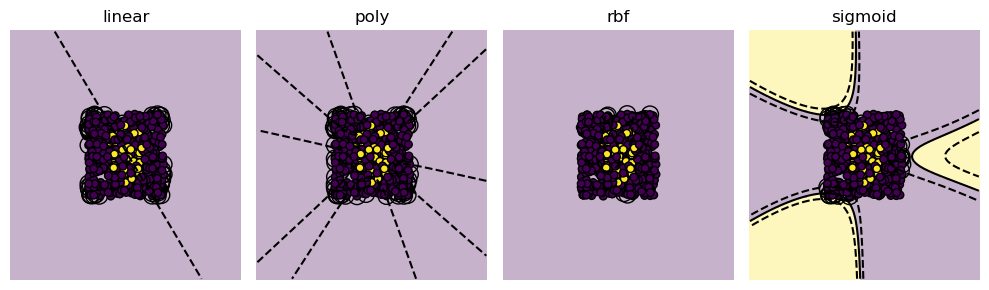

Kernel comparison for ne


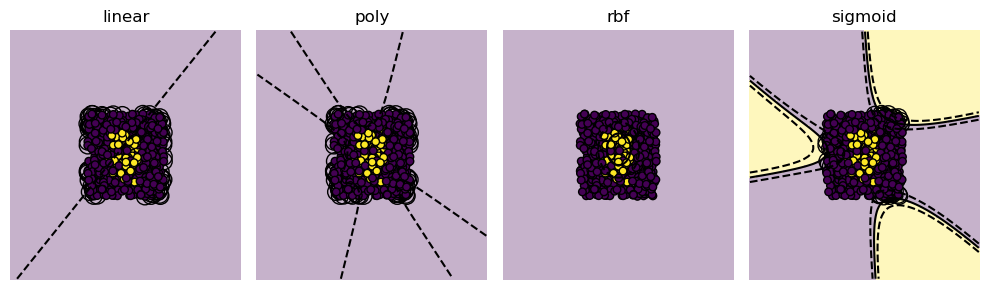

Kernel comparison for ak


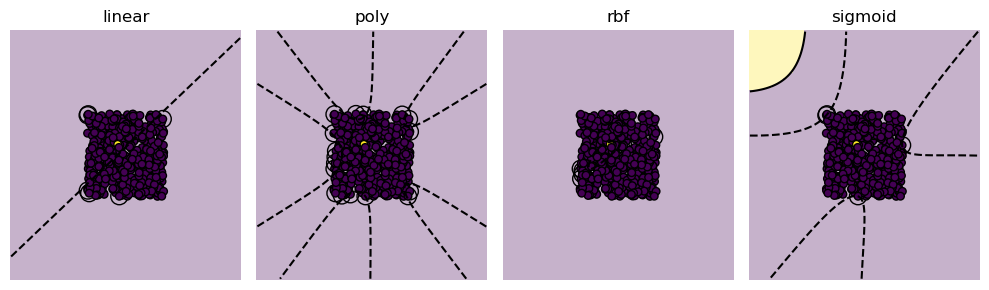

Kernel comparison for ct


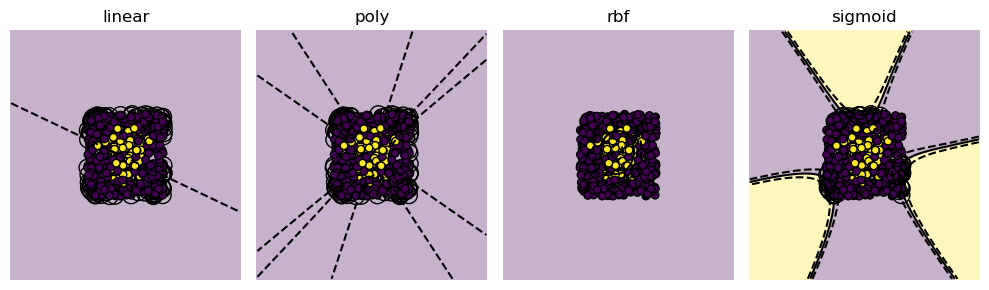

Kernel comparison for nd


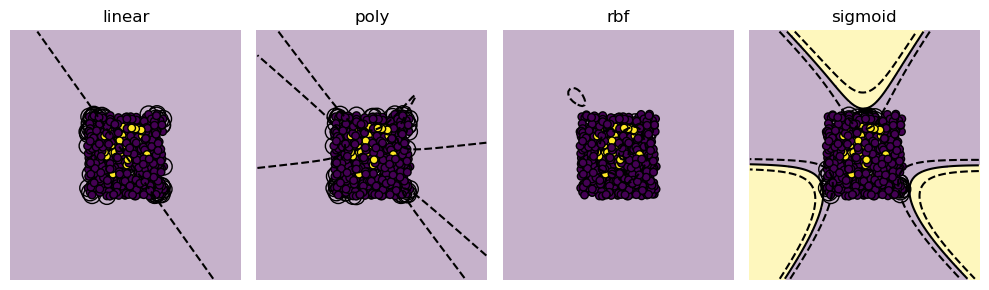

In [42]:
# Non-visual kernel comparison for all flags

images, labels = load_images('/Users/catherinechu/mathematics-and-ai/weekly-projects/week5/flags')

for img, label in zip(images, labels):
    X, y = sample_pixels(img, num_samples=500) 
    print(f"Kernel comparison for {label}")
    kernel_comparison(X, y, if_flag=True)


In [36]:
def run_quantitative_analysis(images, labels, num_samples=500):
    all_results = {}
    kernels = ['linear', 'poly', 'rbf', 'sigmoid']

    for img, label in zip(images, labels):
        X, y = sample_pixels(img, num_samples=num_samples)  # Use the sample_pixels function
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)  # Split the data
        kernel_results = []

        for kernel in kernels:
            clf = svm.SVC(kernel=kernel, degree=3, gamma=5)  # Use fixed degree and gamma
            clf.fit(X_train, y_train)  # Train the classifier
            train_accuracy = clf.score(X_train, y_train)  # Calculate train accuracy
            test_accuracy = clf.score(X_test, y_test)  # Calculate test accuracy
            kernel_results.append((kernel, train_accuracy, test_accuracy))  # Append results

        all_results[label] = kernel_results
        print(f"Results for {label}: {kernel_results}")  # Print results for each flag

    return all_results

all_results = run_quantitative_analysis(images, labels)


Results for ut: [('linear', 0.9142857142857143, 0.94), ('poly', 0.9142857142857143, 0.94), ('rbf', 0.9142857142857143, 0.94), ('sigmoid', 0.8828571428571429, 0.92)]
Results for me: [('linear', 0.9257142857142857, 0.9133333333333333), ('poly', 0.9257142857142857, 0.9133333333333333), ('rbf', 0.9257142857142857, 0.9133333333333333), ('sigmoid', 0.9171428571428571, 0.9066666666666666)]
Results for la: [('linear', 0.8771428571428571, 0.8333333333333334), ('poly', 0.8771428571428571, 0.8333333333333334), ('rbf', 0.8771428571428571, 0.8333333333333334), ('sigmoid', 0.8371428571428572, 0.8133333333333334)]
Results for co: [('linear', 0.7542857142857143, 0.7333333333333333), ('poly', 0.7542857142857143, 0.7333333333333333), ('rbf', 0.8714285714285714, 0.84), ('sigmoid', 0.6457142857142857, 0.68)]
Results for nh: [('linear', 0.8771428571428571, 0.8533333333333334), ('poly', 0.8771428571428571, 0.8533333333333334), ('rbf', 0.8771428571428571, 0.8533333333333334), ('sigmoid', 0.8371428571428572, 

In [46]:
def sample_pixels(image, num_samples=100):
    pixel_data = []
    pixel_labels = []
    height, width = image.shape
    for _ in range(num_samples):
        x1 = random.randint(0, width - 1)
        x2 = random.randint(0, height - 1)
        pixel_data.append([x1 / width - 0.5, x2 / height - 0.5])
        pixel_labels.append(image[x2, x1])
    return np.array(pixel_data), np.array(pixel_labels, dtype=int)

def analyze_flags_performance(images, labels, num_samples=500):
    kernels = ['linear', 'poly', 'rbf', 'sigmoid']
    results = {kernel: [] for kernel in kernels}

    for img, label in zip(images, labels):
        X, y = sample_pixels(img, num_samples=num_samples)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

        for kernel in kernels:
            clf = svm.SVC(kernel=kernel, degree=5, gamma=5)
            clf.fit(X_train, y_train)
            accuracy = accuracy_score(y_test, clf.predict(X_test))
            results[kernel].append((label, accuracy))

    #sort results
    sorted_results = {kernel: sorted(data, key=lambda x: x[1], reverse=True) for kernel, data in results.items()}

    #loop for top 3 in each
    for kernel, data in sorted_results.items():
        top_three = [state for state, _ in data[:3]]
        bottom_three = [state for state, _ in data[-3:]]
        print(f"{kernel.capitalize()} kernel performed best on the flags of the following three states:")
        print(top_three)
        print("It performed worst on the flags of the following three states:")
        print(bottom_three)
        print("\n")

analyze_flags_performance(images, labels)


Linear kernel performed best on the flags of the following three states:
['nv', 'ak', 'ri']
It performed worst on the flags of the following three states:
['ia', 'al', 'md']


Poly kernel performed best on the flags of the following three states:
['nv', 'ak', 'ri']
It performed worst on the flags of the following three states:
['al', 'ia', 'md']


Rbf kernel performed best on the flags of the following three states:
['nv', 'ak', 'ri']
It performed worst on the flags of the following three states:
['hi', 'al', 'md']


Sigmoid kernel performed best on the flags of the following three states:
['nv', 'ak', 'ri']
It performed worst on the flags of the following three states:
['md', 'al', 'fl']




For these experiments, I set `num_samples` to 700 because the results of the experiments seem to be the most stable for this number of sampled pixels.

The linear kernel performed best (i.e., highest test accuracy) on the flags of the following three states: 

Alaska, rhode island, nevada

It performed worst on the flags of the following three states: 

alabama, iowa, maryland

The polynomial kernel performed best on the flags of the following three states: 

alaska, rhode island, nevada

It performed worst on the flags of the following three states: 

alabama, iowa, maryland

The radial-basis function kernel performed best on the flags of the following three states: 

Alaska, rhode island, nevada
It performed worst on the flags of the following three states: 

hawaii, alabama, maryland

The sigmoid kernel performed best on the flags of the following three states: 

alaska, rhode island, nevada
It performed worst on the flags of the following three states:

maryland, alabama, florida

### Part 2.3: Comparison to decision trees
Decision trees and SVMs yield substantially different decision boundaries.

1. An arbitrarily complex decision tree would be able to achieve perfect training accuracy on any data set. Explain why.
2. For a very large data set of flag pixels, an arbitrarily complex decision tree is likely to achieve (almost) perfect test accuracy as well. Explain why.
3. Select four flags for which you anticipate a *simple* decision tree to outperform all your SVMs. Write code that fits a decision tree to a flag pixel data set. Use your code to check your hypothesis. 

An arbitrarily complex decision tree would be able to achieve perfect training accuracy on any data set, because if it infintely splits training data until each node is accounted for all the variations in the dataset will be on a node.

For a very large data set of flag pixels, an arbitrarily complex decision tree is likely to achieve (almost) perfect test accuracy because it can just overfit to account for all the variance in the data and create new splits for everything unanticipated. 

A simple decision tree is likely to perform well on the sampled pixel data of the flags of north carolina, arkansas, texas, and nevada.

In [52]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import svm
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import numpy as np
import os
from PIL import Image
import random

#only do certain images
def load_images(folder, selected_flags):
    images = []
    labels = []
    for filename in os.listdir(folder):
        base_name = filename.split('.')[0]
        if base_name in selected_flags and filename.endswith(".png"):
            img_path = os.path.join(folder, filename)
            img = Image.open(img_path).convert('L')  # Convert image to black and white
            img = np.array(img) // 128  # Convert to binary image (0 or 1)
            images.append(img)
            labels.append(base_name)
    return images, labels

def sample_pixels(image, num_samples=500):
    pixel_data = []
    pixel_labels = []
    height, width = image.shape
    for _ in range(num_samples):
        x = random.randint(0, width - 1)
        y = random.randint(0, height - 1)
        pixel_data.append([x / width, y / height])  # Normalized pixel positions
        pixel_labels.append(image[y, x])
    return np.array(pixel_data), np.array(pixel_labels, dtype=int)

def compare_classifiers(images, labels):
    results = {}
    for img, label in zip(images, labels):
        X, y = sample_pixels(img)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

        # Decision Tree
        tree = DecisionTreeClassifier()
        tree.fit(X_train, y_train)
        tree_acc = tree.score(X_test, y_test)

        # SVM
        svc = svm.SVC(kernel='rbf', gamma='scale')
        svc.fit(X_train, y_train)
        svc_acc = svc.score(X_test, y_test)

        results[label] = {'Decision Tree Accuracy': tree_acc, 'SVM Accuracy': svc_acc}
    
    return results

# Select flags and folder path
selected_flags = ["ca", "tx", "nm", "co"]
folder_path = '/Users/catherinechu/mathematics-and-ai/weekly-projects/week5/flags'
images, labels = load_images(folder_path, selected_flags)
results = compare_classifiers(images, labels)

# Print results
print(results)

{'co': {'Decision Tree Accuracy': 0.9933333333333333, 'SVM Accuracy': 0.8933333333333333}, 'nm': {'Decision Tree Accuracy': 0.9733333333333334, 'SVM Accuracy': 0.9333333333333333}, 'tx': {'Decision Tree Accuracy': 0.9733333333333334, 'SVM Accuracy': 0.9333333333333333}, 'ca': {'Decision Tree Accuracy': 0.84, 'SVM Accuracy': 0.8666666666666667}}


Colorado, new mexico, and texas beat the svm accuracy from the decision accuracy as printed above. I thought california was pretty simple but the SVM was still better than the simple decision tree. 